# Wiggle Magnitudes (weekend vs. weekday)
  
### Purpose & Motivation
The traffic flow oscillations (wiggles) appear to occur in a pattern that suggests they are not random but are instead a reflection of driver behavior (see [`wiggle_ramp_relationships2.ipynb`](https://github.com/mas-dse-c6sander/DSE_Cohort2_Traffic_Capstone/blob/master/cohort2/exploration/wiggle_ramp_relationships2.ipynb)).  To further validate the hypothesized wiggle cause, we need to explore and test additional related hypotheses.

### Hypothesis
If the flow oscillations are due mostly to drivers attempting to arrive at their destinations (eg. work) on or near the hour (or half-hour), the magnitude of the weekday oscillations should be larger than the magnitude of weekend wiggles.
 

### Tasks/Questions to Answer
#### Questions to Answer
1. For a given subset of traffic stations, how do the weekend and weekday wiggle waveforms compare?
2. For this same subset, how doe the magnitudes of the weekend and weekday wiggles compare?

#### Tasks 
1. Load, filter, and transform the data
2. Split the data into weekend vs. weekday
3. Extract wiggles using smoothed mean subtraction
4. Plot weekend vs. weekday wiggles

### Results
In the given set of stations (I-5 South, aggregated over all of 2015), the mean magnitude of the weekday wiggles (dashed red line  <b style='color:red'>---</b>) is greater than the mean magnitude of the weekend wiggles (dashed blue line  <b style='color:blue'>---</b>) in over 99% of the stations (179 of 180 stations).  A single station (off-ramp, station number `1113794`) had equal weekend and weekday magnitudes.

### Conclusion
The results appear to confirm the hypothesis that weekday oscillations have higher magnitudes than the weekend oscillations.  Further investigation along similar lines could include analyzing the magnitude of the oscillations in the early morning hours vs. the mid-day hours (anecdotal evidence seems to indicate the early morning hours have smaller magnitude).


In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import time
from os import listdir
from os.path import isfile, join
from datetime import time

import datetime as dt

import glob


import sys
sys.path.append('../')
import trafficpassion.AnalyzeWiggles as aw

In [2]:
#data locations
data_5min_path = "../../../data/5min/2015/d11/"
meta_path = "../../../data/meta/2015/d11/"

#### Get data file names

In [3]:
##get all files to process
onlyfiles = [f for f in listdir(data_5min_path) if isfile(join(data_5min_path, f))]

In [4]:
onlyfiles[0:3]

['d11_text_station_5min_2015_01_01.txt.gz',
 'd11_text_station_5min_2015_01_02.txt.gz',
 'd11_text_station_5min_2015_01_03.txt.gz']

In [5]:
colnames = [
    'Timestamp','Station','District','Freeway','Direction_of_Travel',
    'LaneType','StationLength','Samples',
    'Perc_Observed','TotalFlow','AvgOccupancy','AvgSpeed',
    'Lane1_Samples','Lane1_Flow','Lane1_AvgOcc','Lane1_AvgSpeed','Lane1_Observed',
    'Lane2_Samples','Lane2_Flow','Lane2_AvgOcc','Lane2_AvgSpeed','Lane2_Observed',
    'Lane3_Samples','Lane3_Flow','Lane3_AvgOcc','Lane3_AvgSpeed','Lane3_Observed',
    'Lane4_Samples','Lane4_Flow','Lane4_AvgOcc','Lane4_AvgSpeed','Lane4_Observed',
    'Lane5_Samples','Lane5_Flow','Lane5_AvgOcc','Lane5_AvgSpeed','Lane5_Observed',
    'Lane6_Samples','Lane6_Flow','Lane6_AvgOcc','Lane6_AvgSpeed','Lane6_Observed',
    'Lane7_Samples','Lane7_Flow','Lane7_AvgOcc','Lane7_AvgSpeed','Lane7_Observed',
    'Lane8_Samples','Lane8_Flow','Lane8_AvgOcc','Lane8_AvgSpeed','Lane8_Observed'
]
colnames = [c.lower() for c in colnames]

In [6]:
len(colnames)

52

In [7]:
from pyspark.sql import SQLContext
from pyspark.sql.types import *

from pyspark.sql.functions import udf
from pyspark.sql.types import IntegerType

from pyspark.sql.functions import hour, mean,minute, stddev, count,max as psmax,min as psmin

#### Make spark schema

struct list was generated with the following code after reading the files with inferschema = true, then hand modified 
```
'[' + ','.join(['StructField("%s",%s(),True)'% (colnames[idx], str(i.dataType))
for idx, i in enumerate(rdd.schema)]) + ']'
```

In [8]:
#print '[\n    ' + ",\n    ".join(['StructField("%s",%s(),True)'% (colnames[idx], str(i.dataType))
#for idx, i in enumerate(rdd.schema)]) + '\n]'

#### Build dataframe with spark

In [8]:
struct_list = [
    StructField("timestamp",TimestampType(),True),
    StructField("station",IntegerType(),True),
    StructField("district",IntegerType(),True),
    StructField("freeway",IntegerType(),True),
    StructField("direction_of_travel",StringType(),True),
    StructField("lanetype",StringType(),True),
    StructField("stationlength",DoubleType(),True),
    StructField("samples",IntegerType(),True),
    StructField("perc_observed",IntegerType(),True),
    StructField("totalflow",IntegerType(),True),
    StructField("avgoccupancy",DoubleType(),True),
    StructField("avgspeed",DoubleType(),True),
    StructField("lane1_samples",IntegerType(),True),
    StructField("lane1_flow",IntegerType(),True),
    StructField("lane1_avgocc",DoubleType(),True),
    StructField("lane1_avgspeed",DoubleType(),True),
    StructField("lane1_observed",IntegerType(),True),
    StructField("lane2_samples",IntegerType(),True),
    StructField("lane2_flow",IntegerType(),True),
    StructField("lane2_avgocc",DoubleType(),True),
    StructField("lane2_avgspeed",DoubleType(),True),
    StructField("lane2_observed",IntegerType(),True),
    StructField("lane3_samples",IntegerType(),True),
    StructField("lane3_flow",IntegerType(),True),
    StructField("lane3_avgocc",DoubleType(),True),
    StructField("lane3_avgspeed",DoubleType(),True),
    StructField("lane3_observed",IntegerType(),True),
    StructField("lane4_samples",IntegerType(),True),
    StructField("lane4_flow",IntegerType(),True),
    StructField("lane4_avgocc",DoubleType(),True),
    StructField("lane4_avgspeed",DoubleType(),True),
    StructField("lane4_observed",IntegerType(),True),
    StructField("lane5_samples",IntegerType(),True),
    StructField("lane5_flow",IntegerType(),True),
    StructField("lane5_avgocc",DoubleType(),True),
    StructField("lane5_avgspeed",DoubleType(),True),
    StructField("lane5_observed",IntegerType(),True),
    StructField("lane6_samples",IntegerType(),True),
    StructField("lane6_flow",IntegerType(),True),
    StructField("lane6_avgocc",DoubleType(),True),
    StructField("lane6_avgspeed",DoubleType(),True),
    StructField("lane6_observed",IntegerType(),True),
    StructField("lane7_samples",IntegerType(),True),
    StructField("lane7_flow",IntegerType(),True),
    StructField("lane7_avgocc",DoubleType(),True),
    StructField("lane7_avgspeed",DoubleType(),True),
    StructField("lane7_observed",IntegerType(),True),
    StructField("lane8_samples",IntegerType(),True),
    StructField("lane8_flow",IntegerType(),True),
    StructField("lane8_avgocc",DoubleType(),True),
    StructField("lane8_avgspeed",DoubleType(),True),
    StructField("lane8_observed",IntegerType(),True)
]

schema_struct = StructType(struct_list)

In [9]:
files = [data_5min_path + filename for filename in onlyfiles]

rdd = spark.read.csv(
    files, 
    header='false',
    timestampFormat='MM/dd/yyyy HH:mm:ss',
    schema=schema_struct,
    inferSchema='false'
)
    
#rdd.take(1)

#### Create weekday and weekend data sets

In [10]:
day_str = ['Mo', 'Tu', 'We', 'Th', 'Fr', 'Sa', 'Su']

day_of_week = udf(
    lambda date_time: date_time.weekday(),
    IntegerType()
)

rdd_5s_days = (
    rdd
    .where('freeway = 5')
    .where('direction_of_travel = "S"')
    .select('timestamp', 'station', 'totalflow', 'avgoccupancy', 'avgspeed')
    .withColumn('day', day_of_week(rdd.timestamp))
    .cache()
)

#rdd_5s_days.take(1)

In [11]:
rdd_5s_weekday = (
    rdd_5s_days
    .where('day < 5')
    .cache()
)

rdd_5s_weekend = (
    rdd_5s_days
    .where('day > 4')
    .cache()
)

#rdd_5s_weekday.take(1)

#### Group by station, time

In [12]:
weekday_agg = (
    rdd_5s_weekday
    .select('timestamp', 'station', 'totalflow', 'avgoccupancy', 'avgspeed')
    .groupBy([
        'station',
        hour("timestamp").alias("hour"),
        minute("timestamp").alias("minute")
    ]).agg(
        mean("totalflow").alias("flow_mean"),
        stddev("totalflow").alias("flow_std"),
        count("totalflow").alias("flow_count"),
        psmax("totalflow").alias("flow_max"),
        psmin("totalflow").alias("flow_min")
    )
)

weekend_agg = (
    rdd_5s_weekend
    .select('timestamp', 'station', 'totalflow', 'avgoccupancy', 'avgspeed')
    .groupBy([
        'station',
        hour("timestamp").alias("hour"),
        minute("timestamp").alias("minute")
    ]).agg(
        mean("totalflow").alias("flow_mean"),
        stddev("totalflow").alias("flow_std"),
        count("totalflow").alias("flow_count"),
        psmax("totalflow").alias("flow_max"),
        psmin("totalflow").alias("flow_min")
    )
)

In [13]:
weekday_df = weekday_agg.toPandas()

print 'shape', weekday_df.station.unique().shape

weekday_df['flow_std_plus_mean'] = weekday_df.flow_mean + weekday_df.flow_std
weekday_df['flow_std_minus_mean'] = weekday_df.flow_mean - weekday_df.flow_std

weekday_df['time'] = weekday_df.apply(lambda x:time(int(x.hour),int(x.minute)),axis = 1)

weekday_df.sort_values('time',inplace=True)

shape (182,)


In [14]:
weekend_df = weekend_agg.toPandas()

print 'shape', weekend_df.station.unique().shape

weekend_df['flow_std_plus_mean'] = weekend_df.flow_mean + weekend_df.flow_std
weekend_df['flow_std_minus_mean'] = weekend_df.flow_mean - weekend_df.flow_std

weekend_df['time'] = weekend_df.apply(lambda x:time(int(x.hour),int(x.minute)),axis = 1)

weekend_df.sort_values('time',inplace=True)

shape (182,)


In [29]:

from scipy.interpolate import interp1d, Akima1DInterpolator
from sklearn import preprocessing
def interpolate(meanVector, kind, factor):
    y = meanVector
    y_len = len(y)
    x = np.arange(0,y_len)
    
    interpolator = {
        'akima': Akima1DInterpolator(x, y),
        'cubic': interp1d(x, y, kind='cubic'),
        'linear': interp1d(x, y, kind='linear')
    }
    
    interpolate = interpolator[kind]

    mid_factor = factor/2
    
    interp = [interpolate(np.arange(i,y_len, factor)) for i in range(factor)]
    myArray = reduce(lambda x,y:x+y,interp)

    my_x = np.arange(mid_factor,y_len, factor)
    
    extrapolator = {
        'akima': Akima1DInterpolator(my_x, myArray/factor),
        'cubic': interp1d(my_x, myArray/factor, kind='cubic'),
        'linear': interp1d(my_x, myArray/factor, kind='linear')
    }
    
    extrapolate = extrapolator[kind]
    
    new_x = np.arange(mid_factor,y_len-mid_factor)
    interpolated = extrapolate( np.arange(mid_factor,y_len-mid_factor))

    #wut??
    #pad front and back with mean vector 
    xprime = np.append(np.arange(0,mid_factor), new_x)
    xprime = np.append(xprime, np.arange(max(xprime)+1,y_len))
    yprime = np.append(y[:mid_factor], interpolated)
    yprime = np.append(yprime, y[-mid_factor:])

    return yprime


def smooth_vector(meanVector, kind='akima', factor=6):
    smoothedVector = interpolate(meanVector, kind, factor )
    diff = meanVector - smoothedVector
    diffVector = diff/np.linalg.norm(diff) 
    
    return {  
        'smoothedVector': smoothedVector, 
        'diffVector': diff,
        'normVector': diffVector
    }

#vectors = smooth_vector(g_df['flow_mean'].values, 'akima', 12)

In [16]:
def loadMeta():
    meta_dir= meta_path + '/d11_text_meta_2015_*.txt'
    meta_files = glob.glob(meta_dir)

    meta_file_list = []
    for meta_file in meta_files:
        date = str('_'.join(meta_file.split('_')[4:7])).split('.')[0]
        df = pd.read_table(meta_file, index_col=None, header=0)
        date_col = pd.Series([date] * len(df))
        df['file_date'] = date_col
        # drop rows that are missing latitude / longitude values
        #df.dropna(inplace=True, subset=['Latitude', 'Longitude'], how='any')
        meta_file_list.append(df)

    meta_frame = pd.concat(meta_file_list).drop_duplicates(subset='ID', keep='last')

    usefwy = [ 56, 125, 805,  52, 163,   8,  15,   5, 905,  78,  94,  54]

    meta_frame = meta_frame[meta_frame.Fwy.apply(lambda x: x in usefwy)]

    #Add freeway name FwyDir
    meta_frame['freeway'] = meta_frame.Fwy.apply(str) + meta_frame.Dir
    
    r_c = {}
    for c in meta_frame.columns:
        r_c[c]=c.lower()
    
    meta_frame=meta_frame.rename(columns = r_c )
    return meta_frame

meta_df = loadMeta()
meta_df = meta_df[ meta_df.type.isin(['ML', 'OR', 'FR']) ]

In [57]:
type_map = {'ML':'Main-Line', 'OR': 'ON-Ramp', 'FR':'OFF-Ramp'}

def make_maps_url( stations, fancy=False, only_ramps=False ):
    meta_stations = meta_df.id.unique()
    if fancy:
        url = 'http://maps.google.com/maps/api/staticmap?&size=1024x1024&zoom=14&maptype=roadmap&'
        marker = 'markers=color:{}|label:{}|{},{}&'
        for i, s in enumerate(stations):
            if s not in meta_stations:
                continue
            s_df = meta_df[meta_df.id==s].iloc[0]
            if only_ramps and (s_df.type=='ML'):
                continue
            color = 'blue' if s_df.type == 'ML' else 'red'
            label = '{}_[{}]_{}'.format(s_df.type, s_df.abs_pm, s_df.id )
            lat, lon = s_df.latitude, s_df.longitude
            url += marker.format(color, label, lat, lon)
        return url
    else:
        urls = []
        base_url = 'https://www.google.com/maps/place'
        for i, s in enumerate(stations):
            if s not in meta_stations:
                continue
            s_df = meta_df[meta_df.id==s].iloc[0]
            if only_ramps and (s_df.type=='ML'):
                continue
            label = '{} [{}] {} - {}'.format(type_map[s_df.type], s_df.abs_pm, s_df.id, s_df['name'] )
            lat, lon = s_df.latitude, s_df.longitude
            url = '{}/{},{}'.format(base_url, lat, lon)
            urls.append( [url, label] )
        return urls

In [61]:
def plot_ramp_wiggles( station, t_min=0, t_max=23, links=True, 
                      figsize=(15,5), magnitude=False, meanline=False ):
    if station not in meta_df.id.unique():
        print 'Station [{}] not found in meta data, skipping station'.format(station)
        return

    plt.figure(figsize = figsize)

    colors = ['#e41a1c','#377eb8','#4daf4a','#984ea3',
              '#ff7f00','#ffff33','#a65628','#f781bf','#999999']
    hddl=[]

    if links:
        for url in make_maps_url( [station] ):
            print url[1], url[0]

    ##
    ## Plot weekday wiggles
    ##
    r_df = weekday_df.groupby('station').get_group(station).copy()
    vectors = smooth_vector(r_df['flow_mean'].values, 'akima', 24)
    r_df.loc[:,'smoothedVector'] = vectors['smoothedVector']
    r_df.loc[:,'diffVector'] = vectors['diffVector']
    s_df = meta_df[meta_df.id==station].iloc[0]
    label = 'Weekday {} [ID: {}] {}'.format(type_map[s_df.type], s_df.id, s_df['name'] )
    r_df = r_df.set_index('time').sort_index().loc[dt.time(t_min, 0):dt.time(t_max, 0),:].reset_index()
    X, Y = r_df['time'], r_df['diffVector']
    if magnitude:
        Y = abs(Y)
    hddl += plt.plot(X, Y, color=colors[0], label=label)
    
    if meanline:
        label = 'Mean Weekday {} [ID: {}] {}'.format(type_map[s_df.type], s_df.id, s_df['name'] )
        hline = plt.axhline( np.mean(Y), color=colors[0], linestyle='dashed', alpha=0.25, label=label)
        hddl.append( hline )
    
    ##
    ## Plot weekend wiggles
    ##
    r_df = weekend_df.groupby('station').get_group(station).copy()
    vectors = smooth_vector(r_df['flow_mean'].values, 'akima', 24)
    r_df.loc[:,'smoothedVector'] = vectors['smoothedVector']
    r_df.loc[:,'diffVector'] = vectors['diffVector']
    s_df = meta_df[meta_df.id==station].iloc[0]
    label = 'Weekend {} [ID: {}] {}'.format(type_map[s_df.type], s_df.id, s_df['name'] )
    r_df= r_df.set_index('time').sort_index().loc[dt.time(t_min, 0):dt.time(t_max, 0),:].reset_index()
    X, Y = r_df['time'], r_df['diffVector']
    if magnitude:
        Y = abs(Y)
    hddl += plt.plot(X, Y, color=colors[1], label=label)
    
    if meanline:
        label = 'Mean Weekday {} [ID: {}] {}'.format(type_map[s_df.type], s_df.id, s_df['name'] )
        hline = plt.axhline( np.mean(Y), color=colors[1], linestyle='dashed', alpha=0.25, label=label)
        hddl.append( hline )
    
    plt.axhline(0, color='green', alpha=0.25)

    plt.legend(handles=hddl, bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
               ncol=2, mode="expand", borderaxespad=0., fontsize=10)

    for i in range(0, len(r_df), 12):
        plt.axvline(x=r_df['time'].iloc[i], linewidth=0.5, color='gray')
        if i < (len(r_df)-6):
            plt.axvline(x=r_df['time'].iloc[i+6], linewidth=0.1, color='gray')

    ticks = [dt.time(i,0) for i in range(t_min, t_max+1)]
    ticktext = ['{}{}'.format((i if i < 13 else i%12), ('am' if i < 12 else 'pm')) for i in range(t_min, t_max+1)]
    plt.xticks(ticks, ticktext)

    plt.xlabel('Time of Day')
    plt.ylabel('Wiggle Magnitude')
    plt.show()

#plot_ramp_wiggles( 1114268, links=True, figsize=(15,5), magnitude=True, meanline=True )

#### Examine test station

Main-Line [29.512] 1114832 - N/O GENESEE AVE https://www.google.com/maps/place/32.889351,-117.227633


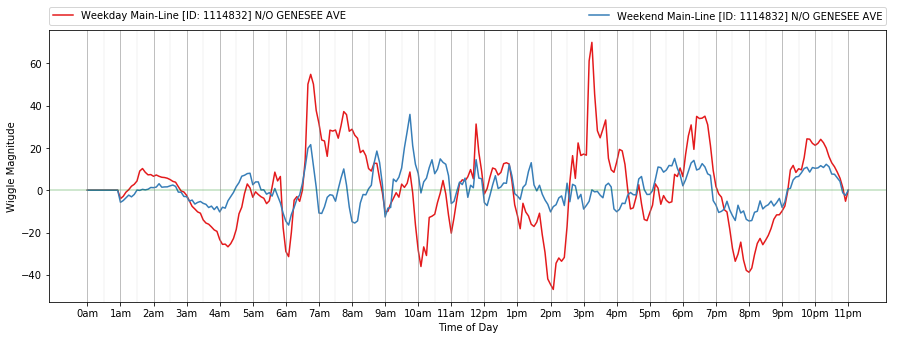

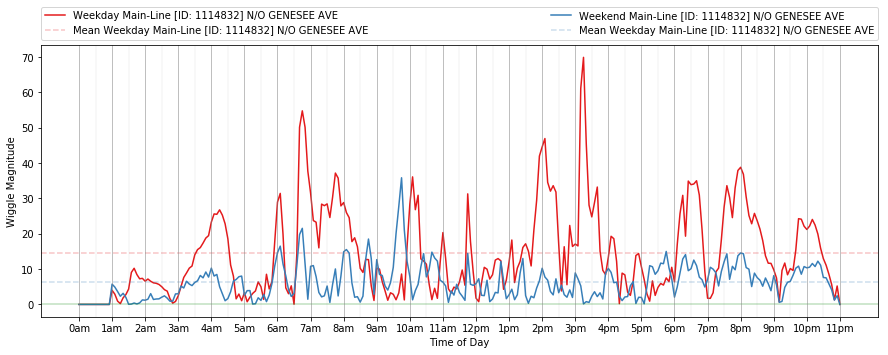

In [64]:
station = 1114832
plot_ramp_wiggles( station, links=True, figsize=(15,5) )
plot_ramp_wiggles( station, links=False, figsize=(15,5), magnitude=True, meanline=True )

#### Plot all stations in subset

Main-Line [13.372] 1114268 -  N/O 28TH ST https://www.google.com/maps/place/32.69574,-117.135196


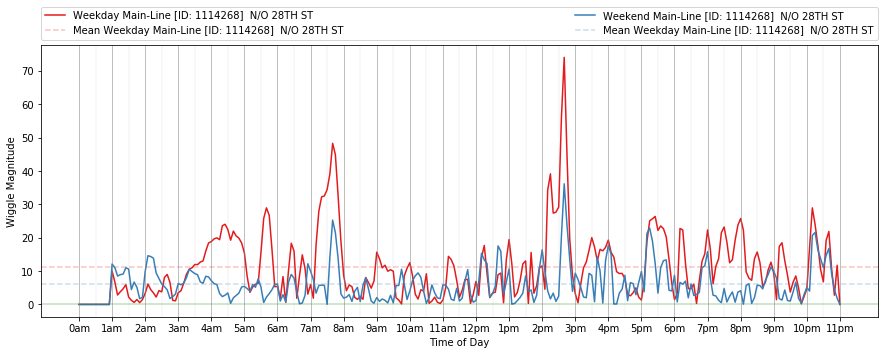

Main-Line [14.416] 1117774 - SB5 @ Imperial https://www.google.com/maps/place/32.7062,-117.147722


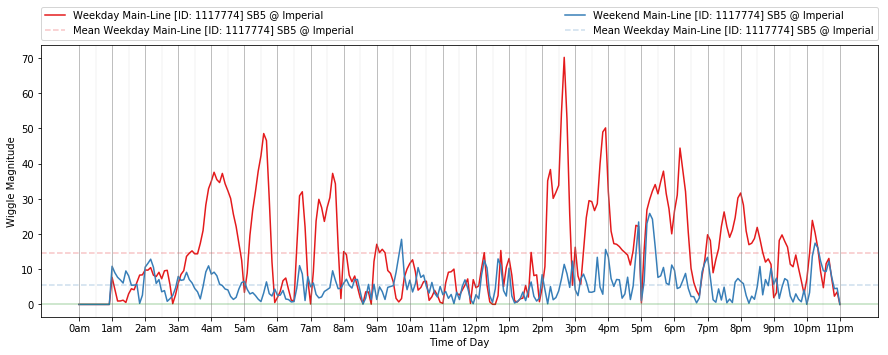

Main-Line [5.324] 1123134 - Main St to 5 SB https://www.google.com/maps/place/32.59507,-117.088901


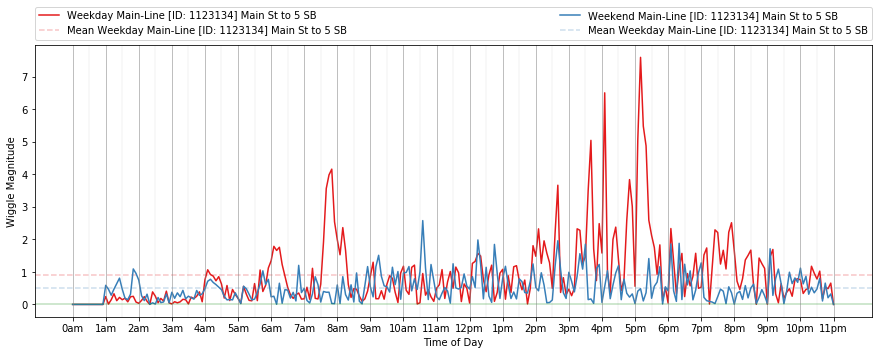

ON-Ramp [27.794] 1108453 - NOBEL DR https://www.google.com/maps/place/32.864527,-117.230028


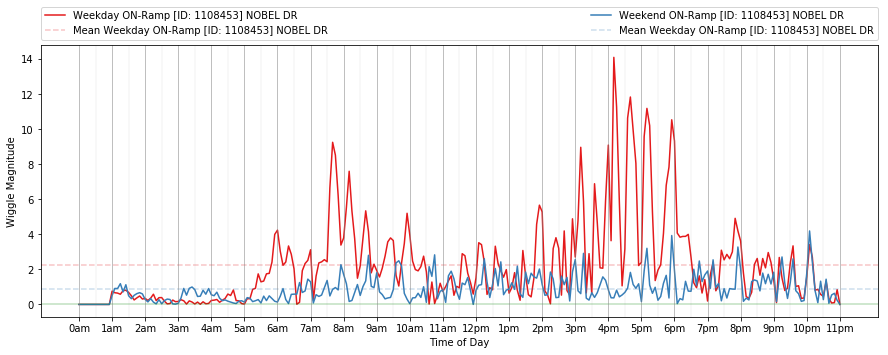

ON-Ramp [18.822] 1108616 - OLD TOWN AVE https://www.google.com/maps/place/32.746784,-117.191904


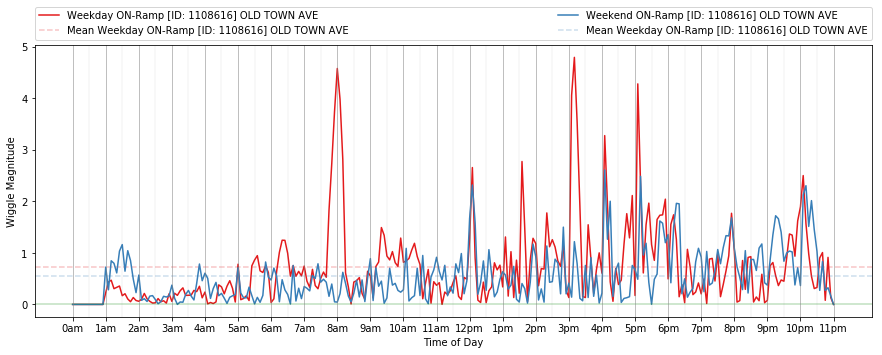

Main-Line [55.858] 1119966 - S/O SANTA MARGARITA https://www.google.com/maps/place/33.230196,-117.400904


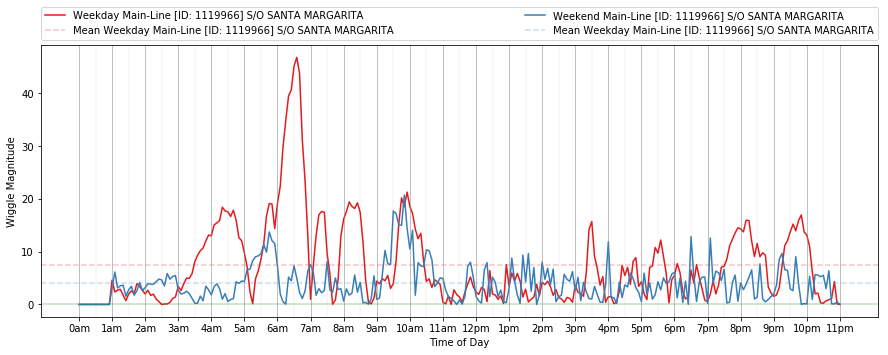

Main-Line [29.512] 1114832 - N/O GENESEE AVE https://www.google.com/maps/place/32.889351,-117.227633


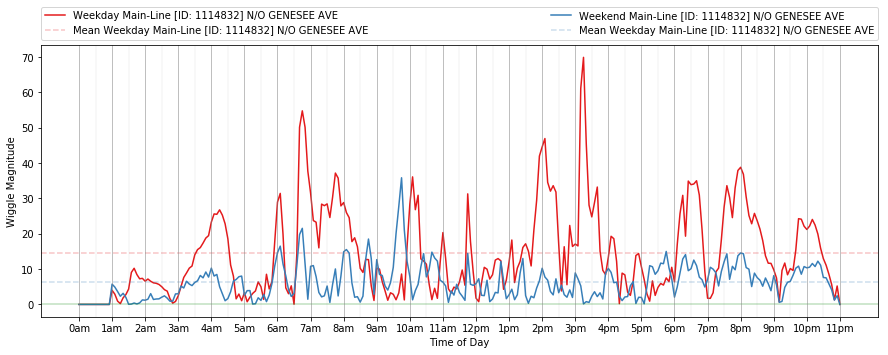

Main-Line [28.355] 1108498 - WB LA JOLLA VILLAGE https://www.google.com/maps/place/32.87259,-117.229295


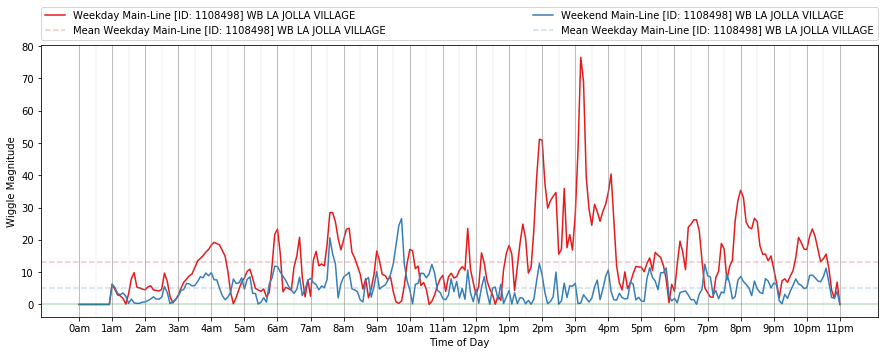

Main-Line [1.14] 1118326 - 5 SB @ Via de Ysidro https://www.google.com/maps/place/32.551447,-117.045806


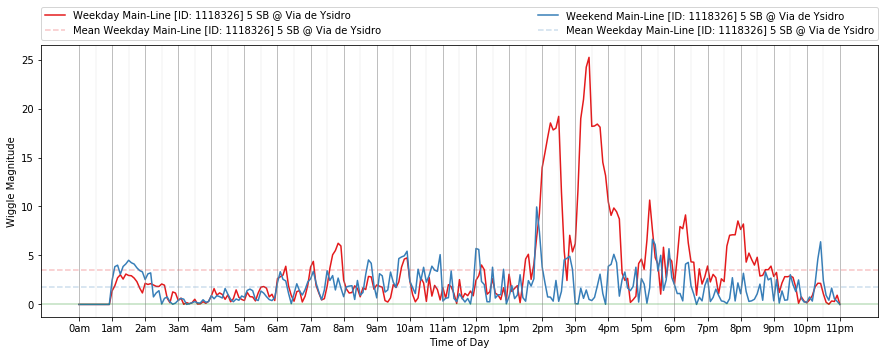

Main-Line [14.677] 1122726 - North of Imperial Av https://www.google.com/maps/place/32.70998,-117.14776


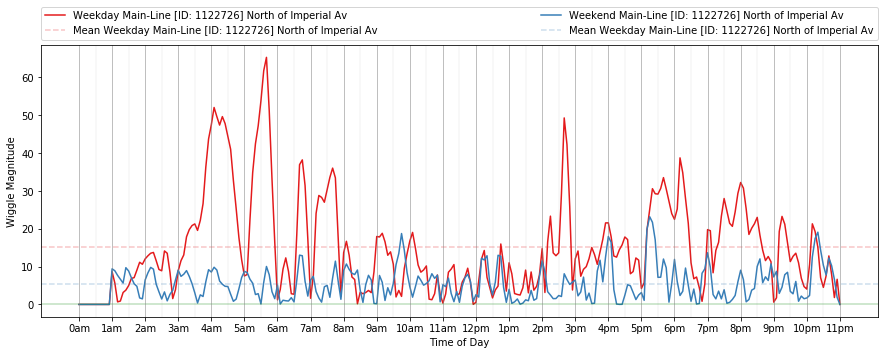

Main-Line [19.676] 1115355 - SB 5 S/O 8 https://www.google.com/maps/place/32.755407,-117.202366


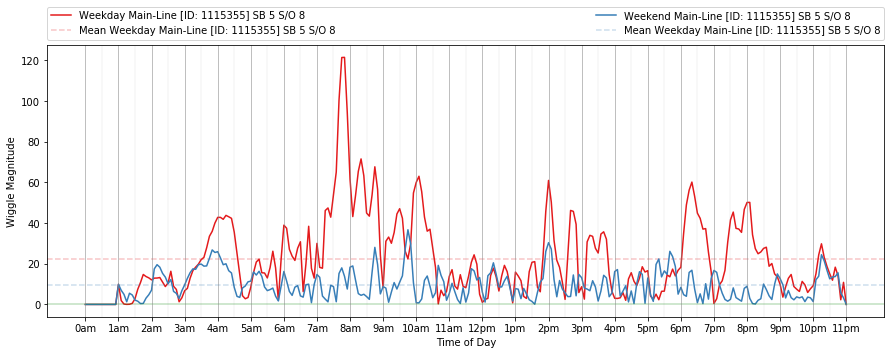

OFF-Ramp [49.108] 1113794 - TAMARACK AVE https://www.google.com/maps/place/33.151704,-117.336331


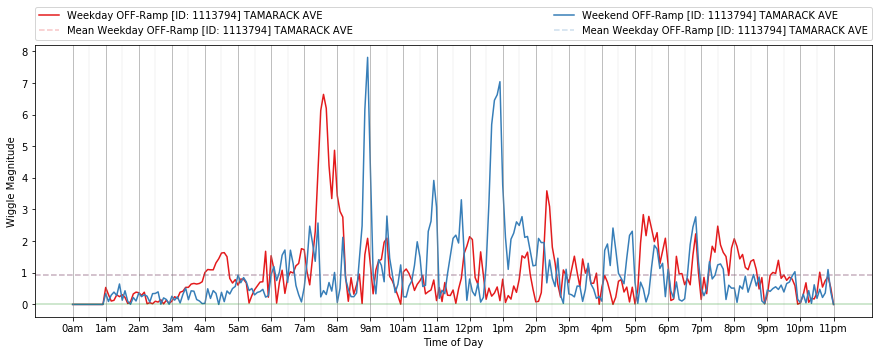

Main-Line [15.628] 1114318 - South of Park Blvd https://www.google.com/maps/place/32.723198,-117.150182


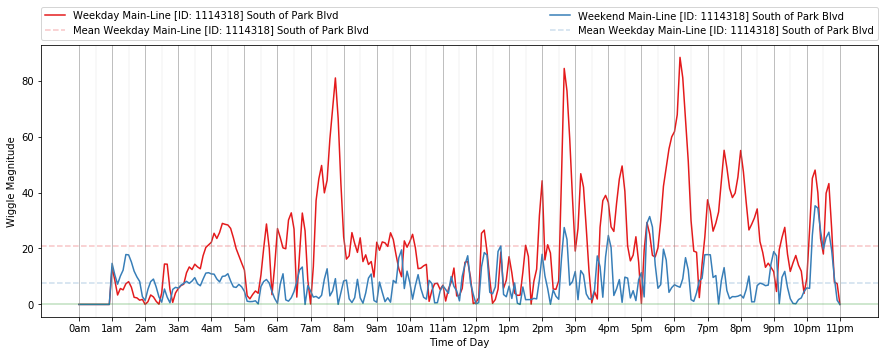

Main-Line [53.658] 1115348 - SB 5 @76 https://www.google.com/maps/place/33.203488,-117.381365


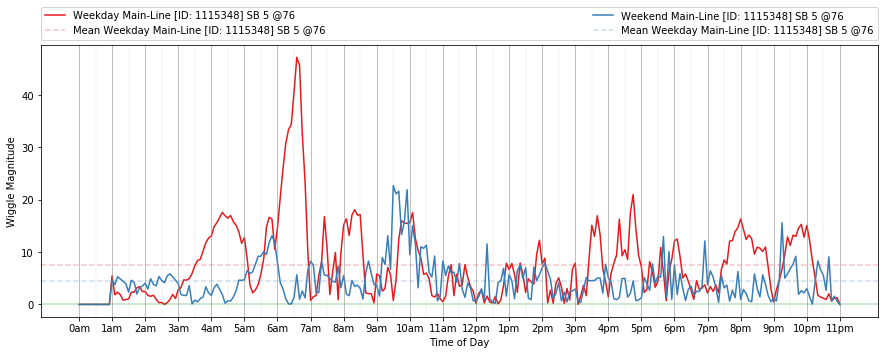

ON-Ramp [49.948] 1108658 - CARLSBAD VILLAGE DR https://www.google.com/maps/place/33.162818,-117.342266


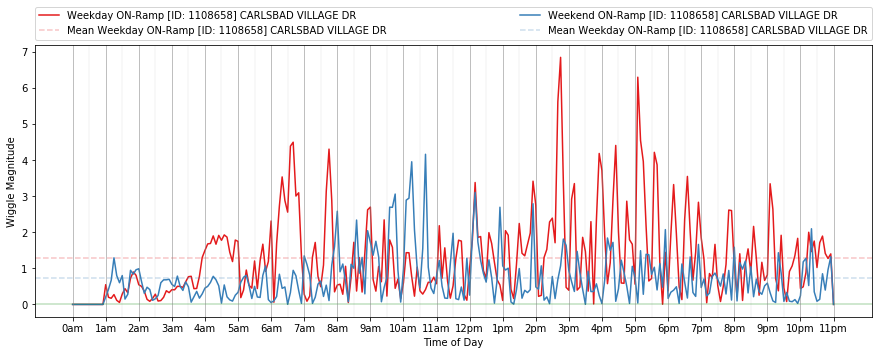

Main-Line [18.822] 1108615 - OLD TOWN AVE https://www.google.com/maps/place/32.746784,-117.191904


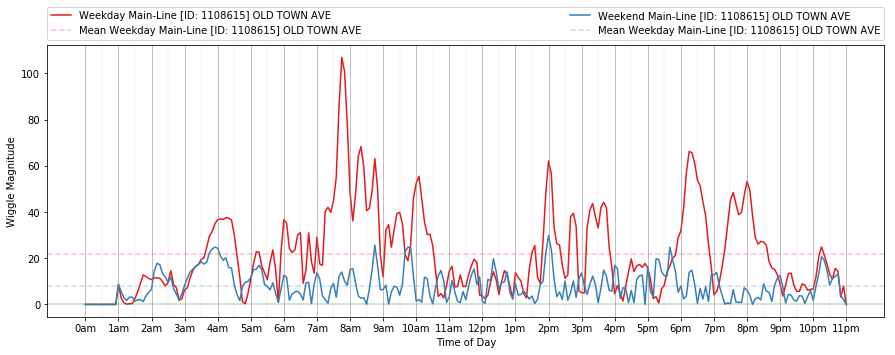

Main-Line [7.819] 1118428 - 5 SB N/O H St https://www.google.com/maps/place/32.630458,-117.096492


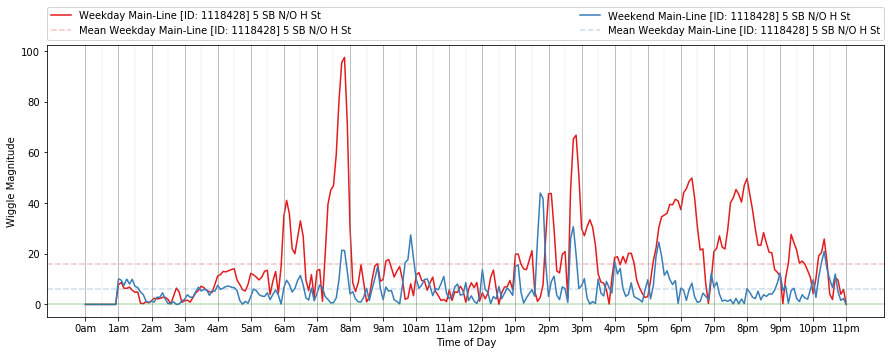

ON-Ramp [41.385] 1108480 - ENCINITAS BLVD https://www.google.com/maps/place/33.048438,-117.287351


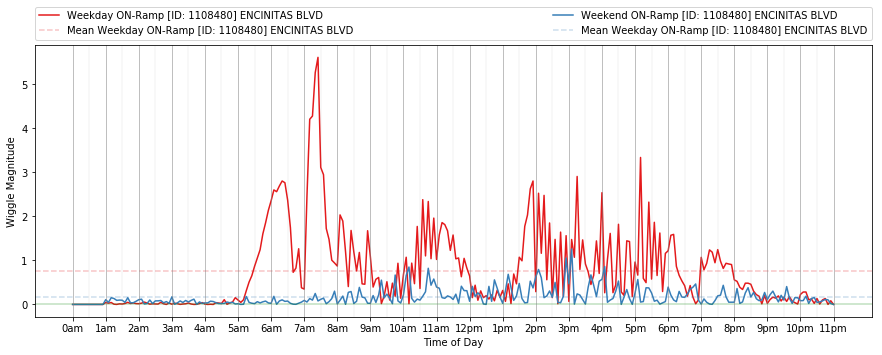

Main-Line [49.948] 1108657 - CARLSBAD VILLAGE DR https://www.google.com/maps/place/33.162818,-117.342266


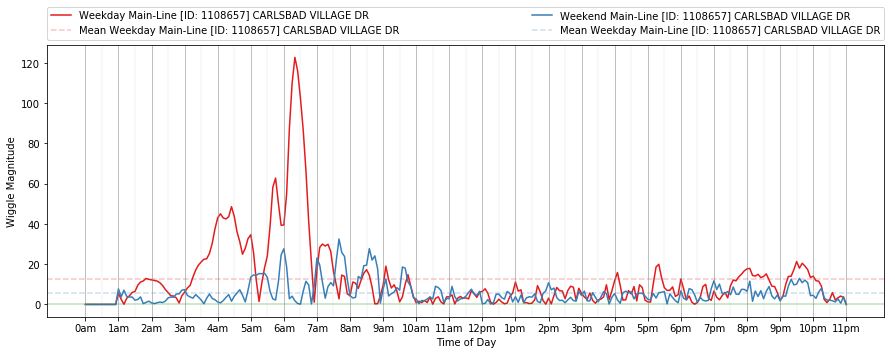

Main-Line [1.291] 1114708 - N/O VIA DE SAN YSIDR https://www.google.com/maps/place/32.552409,-117.04812


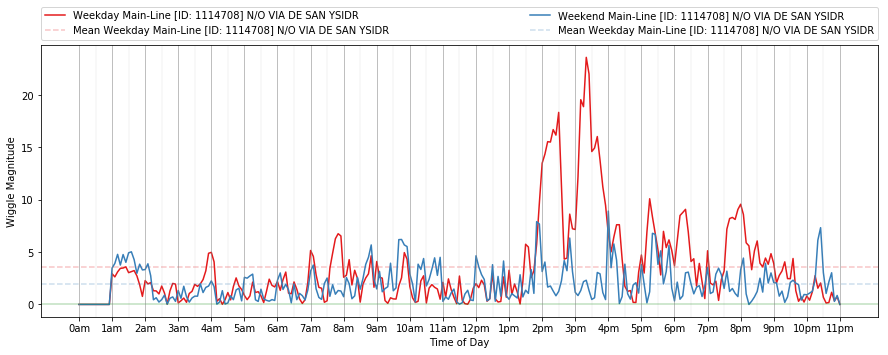

Main-Line [31.136] 1122544 - 5 SB N/O 5/805 https://www.google.com/maps/place/32.911761,-117.228812


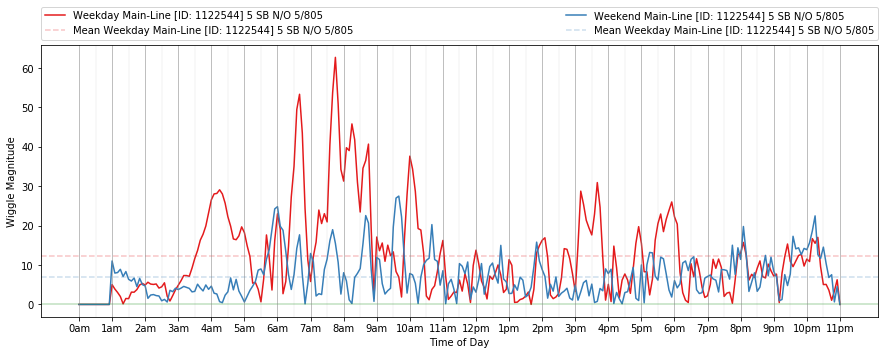

ON-Ramp [17.23] 1108606 - KETTNER BLVD https://www.google.com/maps/place/32.731834,-117.171905


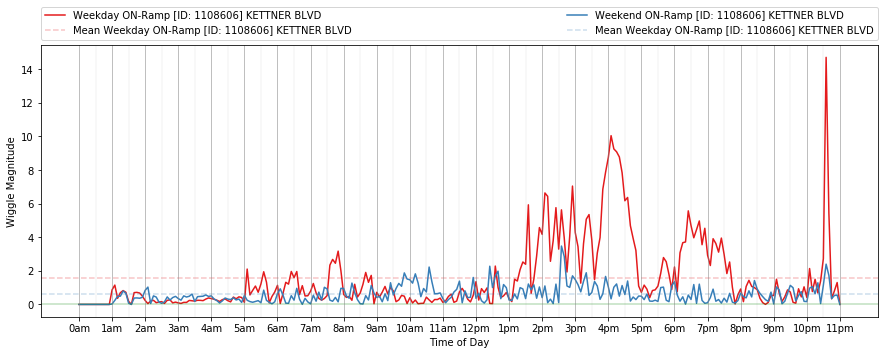

ON-Ramp [38.439] 1108474 - MANCHESTER AVE https://www.google.com/maps/place/33.010643,-117.265228


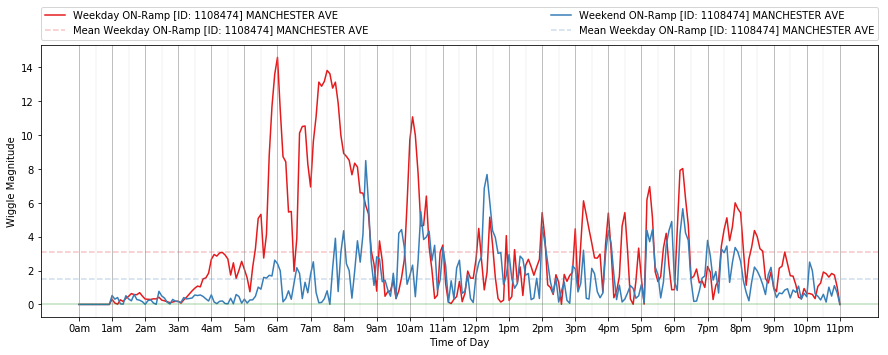

ON-Ramp [42.548] 1108724 - LEUCADIA BLVD https://www.google.com/maps/place/33.064772,-117.292309


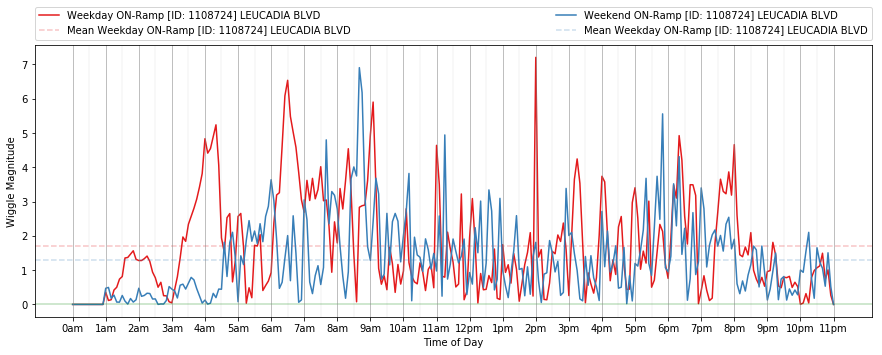

Main-Line [8.71] 1120603 - SB5 N/O E ST https://www.google.com/maps/place/32.642724,-117.101267


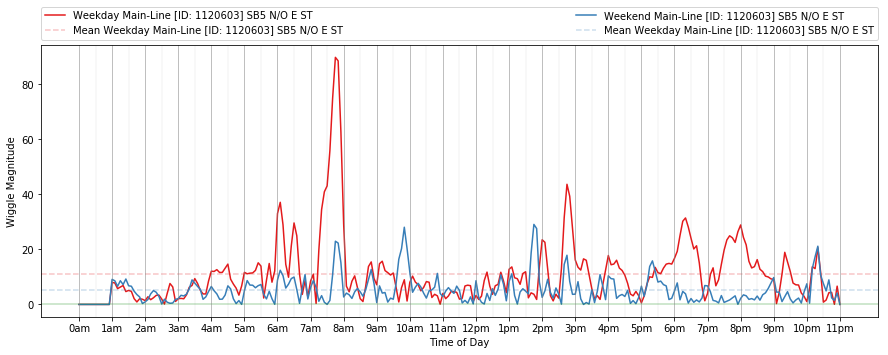

ON-Ramp [49.108] 1108561 - TAMARACK AVE https://www.google.com/maps/place/33.151704,-117.336331


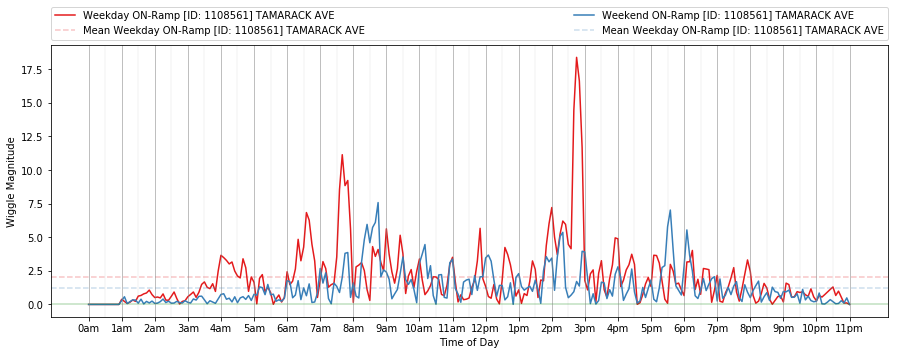

Main-Line [15.698] 1117683 - SB5 @PARK BLVD https://www.google.com/maps/place/32.723795,-117.151061


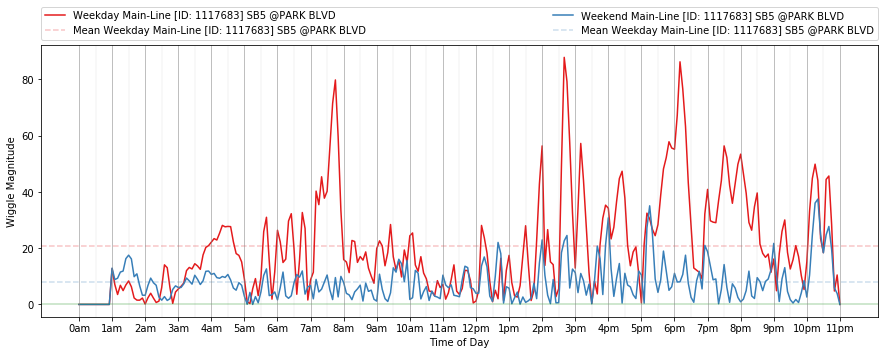

ON-Ramp [18.05] 1108610 - HANCOCK ST https://www.google.com/maps/place/32.741281,-117.180454


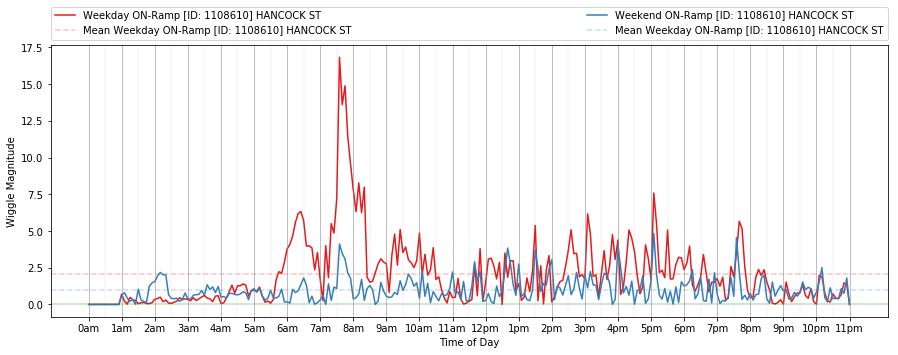

Main-Line [23.466] 1119307 - SB5 @BALBOA AVE https://www.google.com/maps/place/32.807702,-117.216754


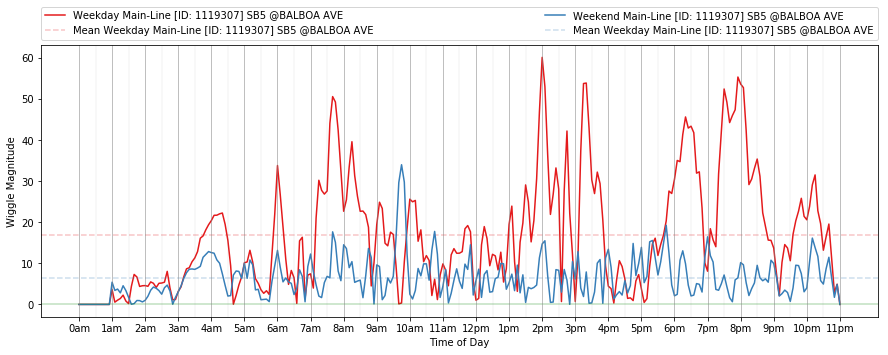

Station [1120377] not found in meta data, skipping station
Main-Line [17.23] 1108605 - KETTNER BLVD https://www.google.com/maps/place/32.731834,-117.171905


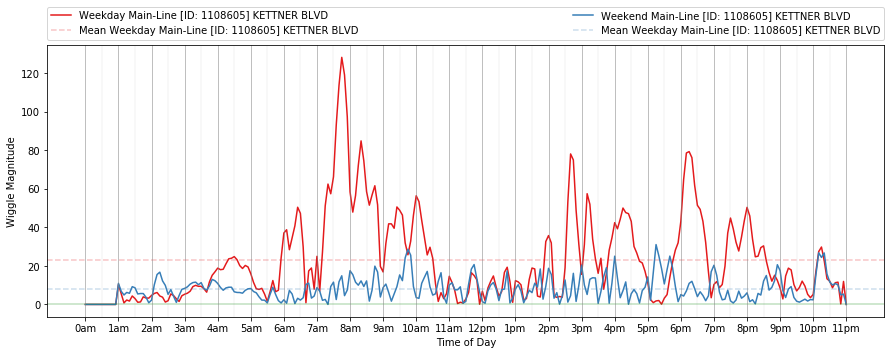

Main-Line [46.158] 1119915 - SB 5 N/O POINSETTIA https://www.google.com/maps/place/33.112683,-117.316473


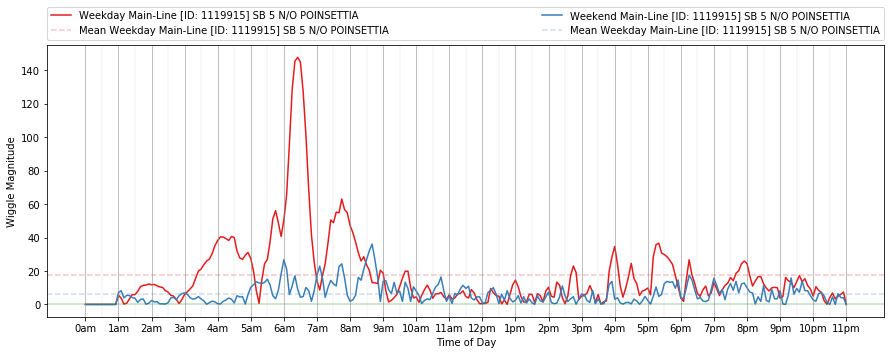

Main-Line [30.532] 1123069 - 5 S SO 5/805 Split https://www.google.com/maps/place/32.903777,-117.224665


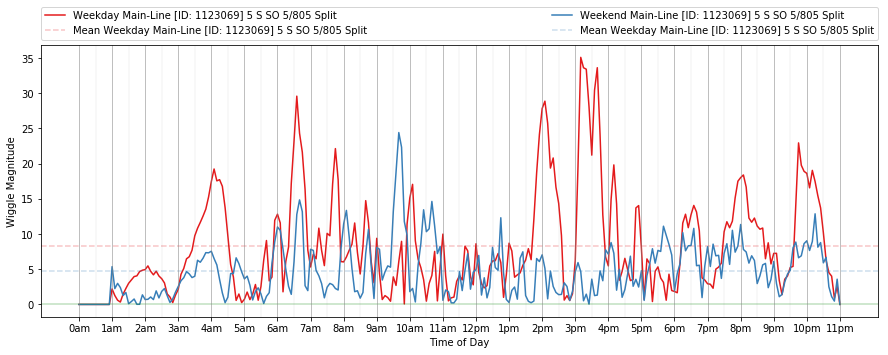

OFF-Ramp [50.568] 1113788 - LAS FLORES DR https://www.google.com/maps/place/33.17092,-117.346811


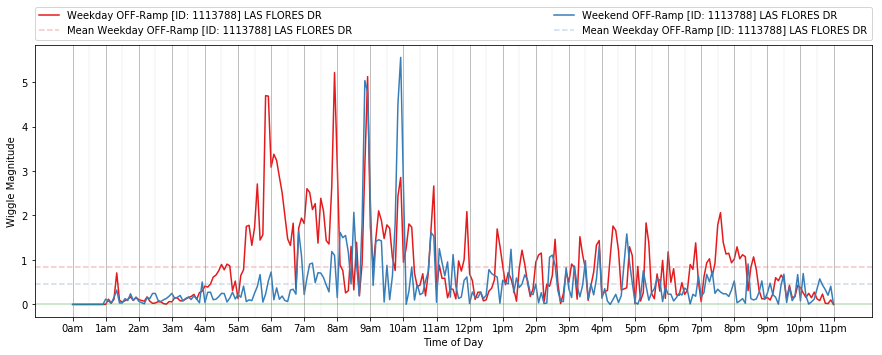

Station [1119532] not found in meta data, skipping station
Main-Line [35.108] 1119842 - SB 5 SAN DIEGUITO https://www.google.com/maps/place/32.96573,-117.247857


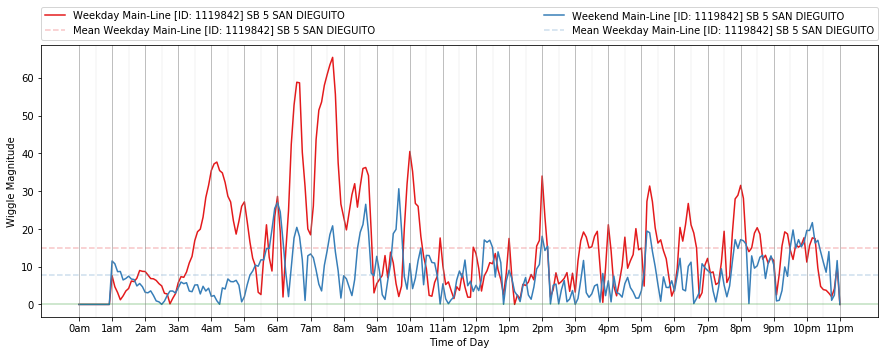

Main-Line [56.858] 1119978 - .5 N/O STA MARGRITA https://www.google.com/maps/place/33.240152,-117.413376


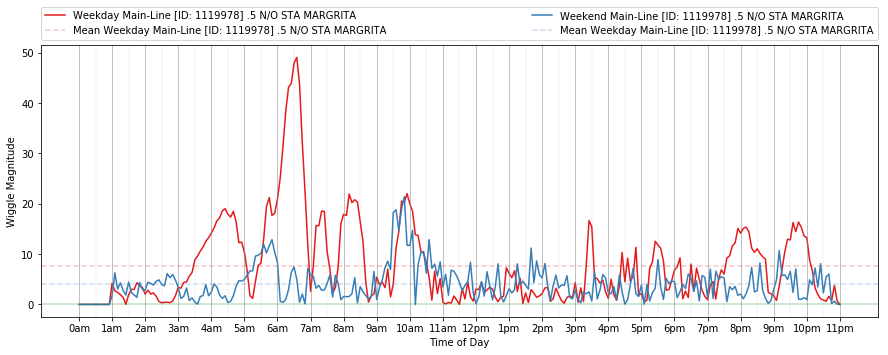

Main-Line [24.118] 1118529 - 5 SB Mission Bay Dr https://www.google.com/maps/place/32.815542,-117.222956


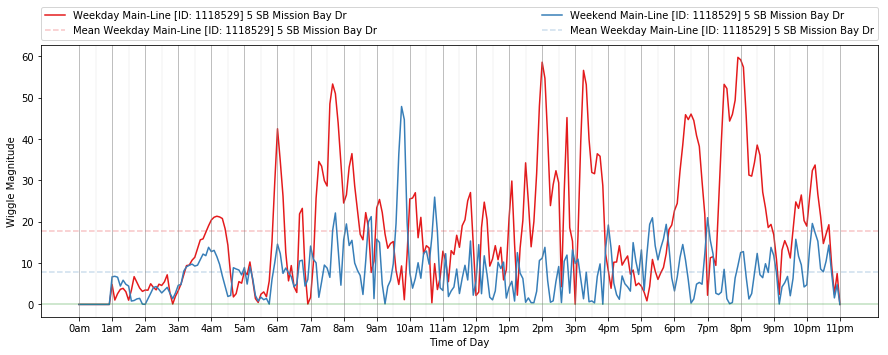

Main-Line [15.23] 1117810 - SB 5 @ B ST https://www.google.com/maps/place/32.718001,-117.147844


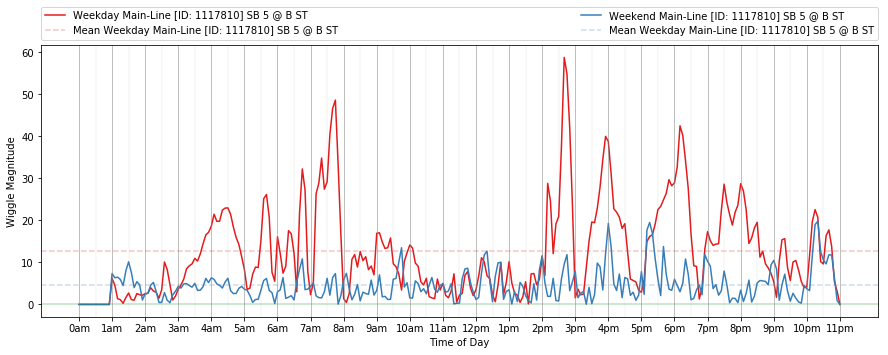

OFF-Ramp [18.822] 1100348 - OLD TOWN/HANCOCK https://www.google.com/maps/place/32.746784,-117.191904


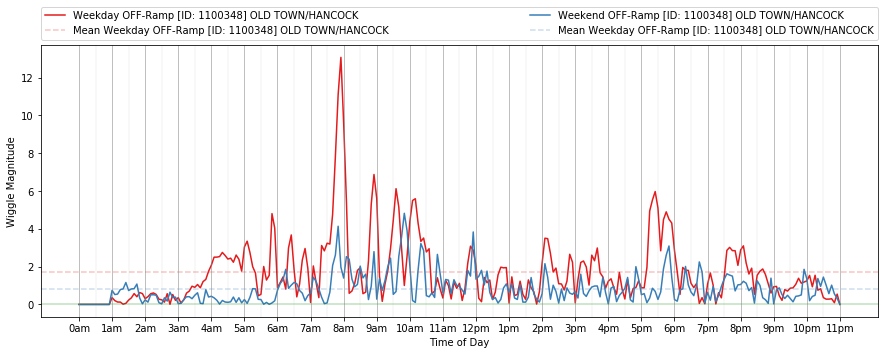

Main-Line [37.255] 1108471 - LOMAS SANTA FE DR https://www.google.com/maps/place/32.995868,-117.256708


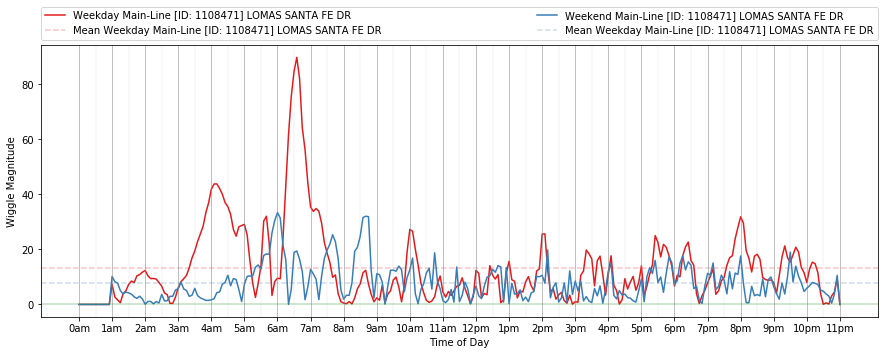

Main-Line [8.491] 1122601 - E St on to 5 SB https://www.google.com/maps/place/32.639722,-117.100176


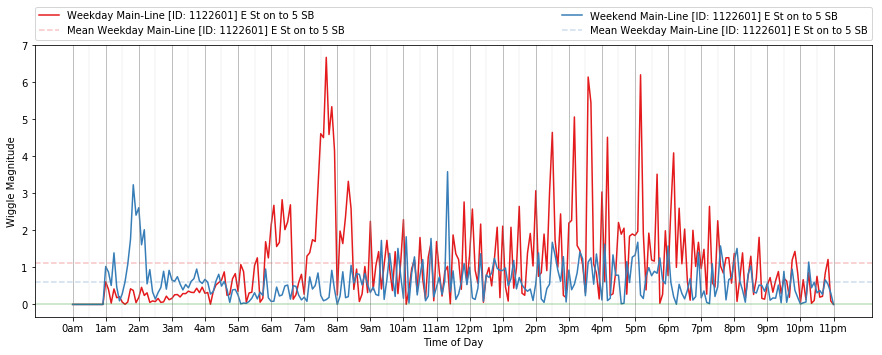

Main-Line [26.621] 1108669 - Gilman Dr https://www.google.com/maps/place/32.848532,-117.235725


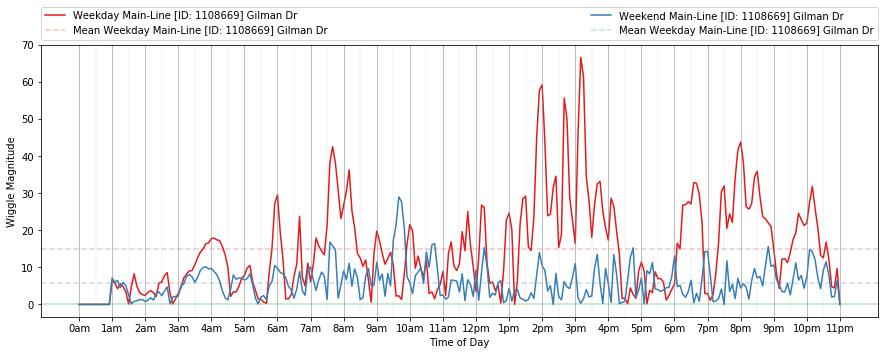

Main-Line [2.186] 1118341 - 5 SB @ Dairy Mart https://www.google.com/maps/place/32.558188,-117.061806


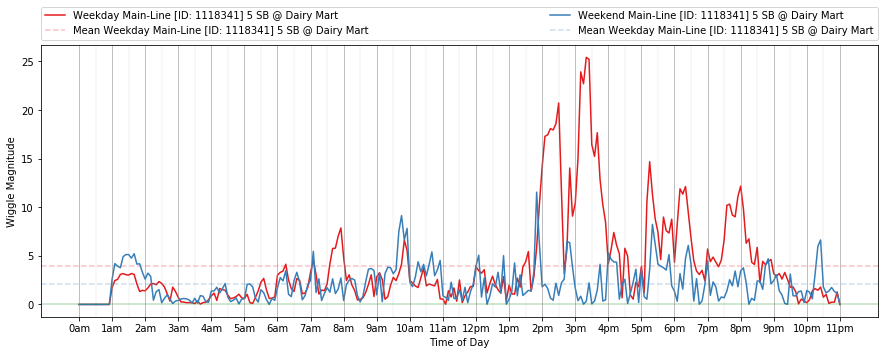

OFF-Ramp [31.517] 1120749 - Carmel Mt. To SB 5 https://www.google.com/maps/place/32.91625,-117.232541


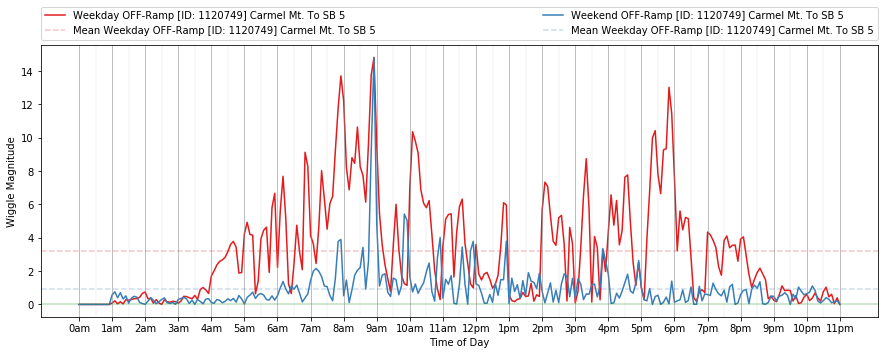

ON-Ramp [25.739] 1108668 - ARDATH RD/SR-52 https://www.google.com/maps/place/32.836089,-117.234107


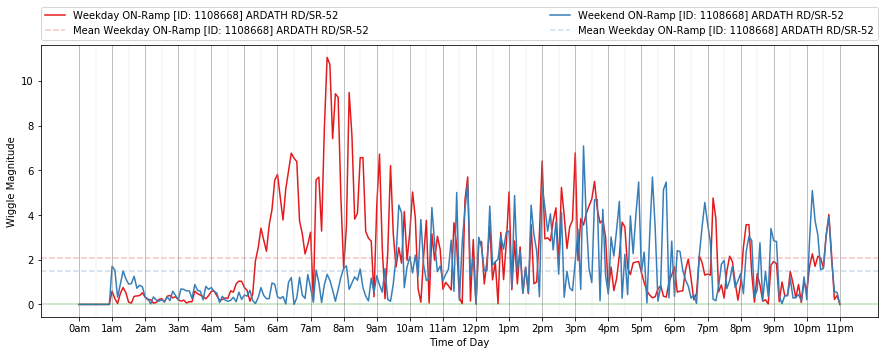

Main-Line [27.794] 1108452 - Nobel Dr https://www.google.com/maps/place/32.864527,-117.230028


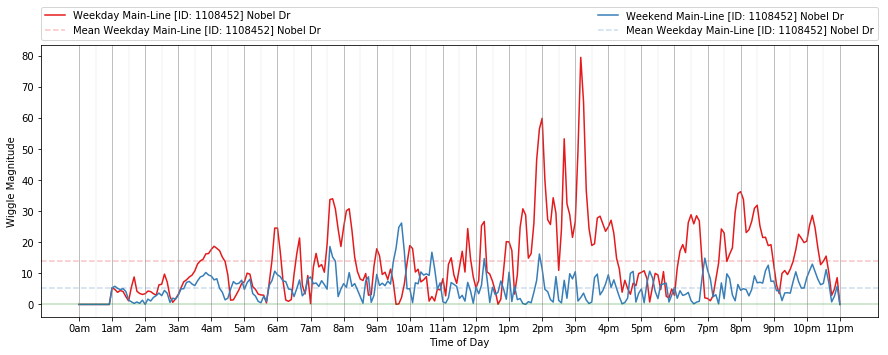

Main-Line [62.419] 1121712 - 5 SB  Las Pulgas Rd https://www.google.com/maps/place/33.303834,-117.470867


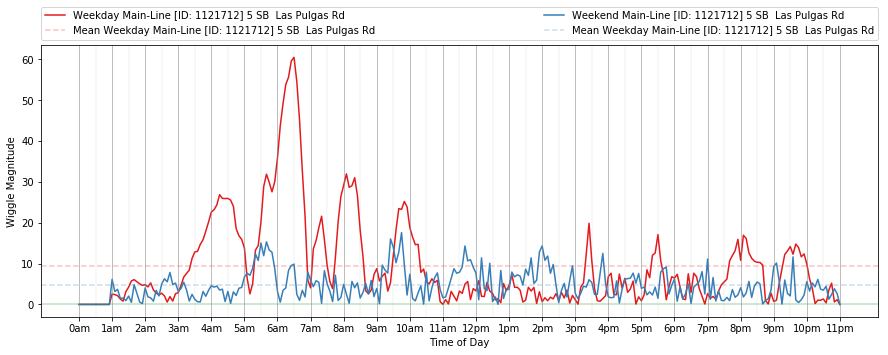

ON-Ramp [31.517] 1118152 - Carmel Mt. To SB 5 https://www.google.com/maps/place/32.91625,-117.232541


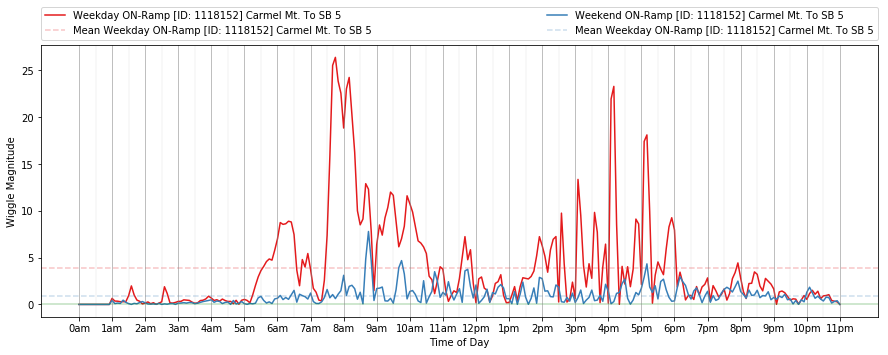

OFF-Ramp [45.293] 1113939 - POINSETTIA LN https://www.google.com/maps/place/33.101626,-117.309439


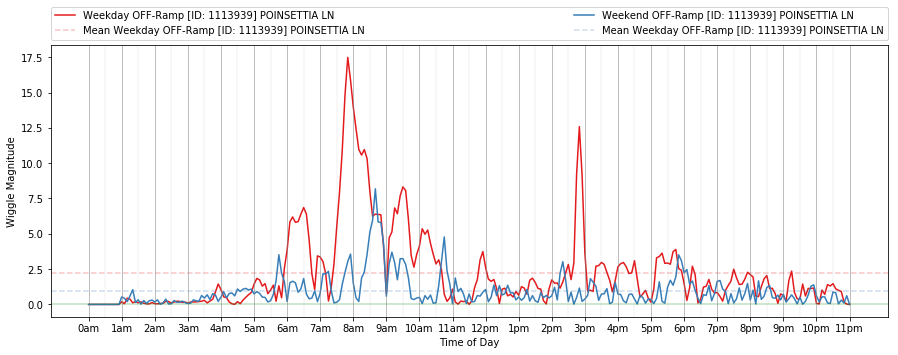

ON-Ramp [34.159] 1108433 - EB DEL MAR HEIGHTS https://www.google.com/maps/place/32.952324,-117.244271


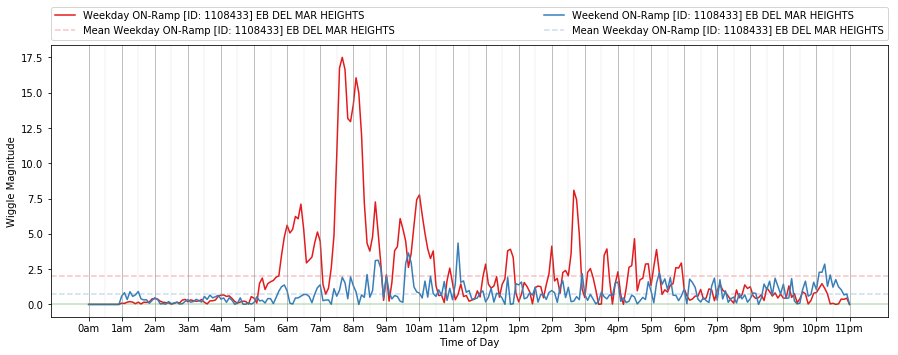

Station [1120419] not found in meta data, skipping station
ON-Ramp [28.355] 1108499 - WB LA JOLLA VILLAGE https://www.google.com/maps/place/32.87259,-117.229295


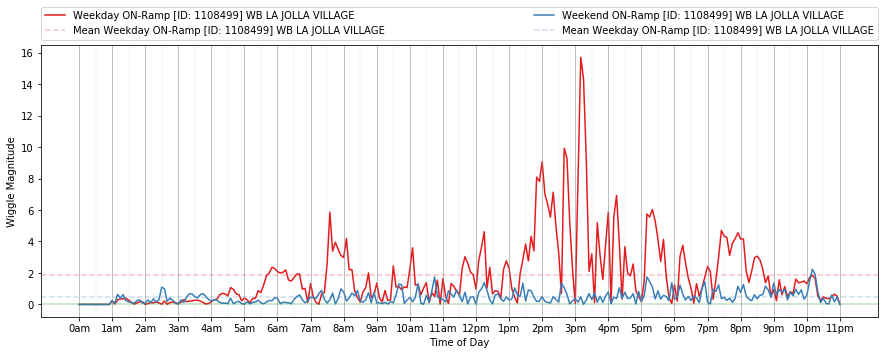

OFF-Ramp [51.271] 1113782 - CASSIDY ST https://www.google.com/maps/place/33.179471,-117.353435


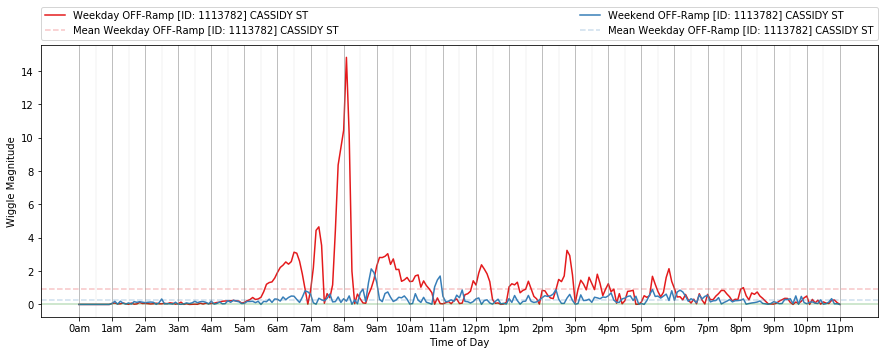

OFF-Ramp [47.823] 1113797 - CANNON RD https://www.google.com/maps/place/33.134215,-117.329382


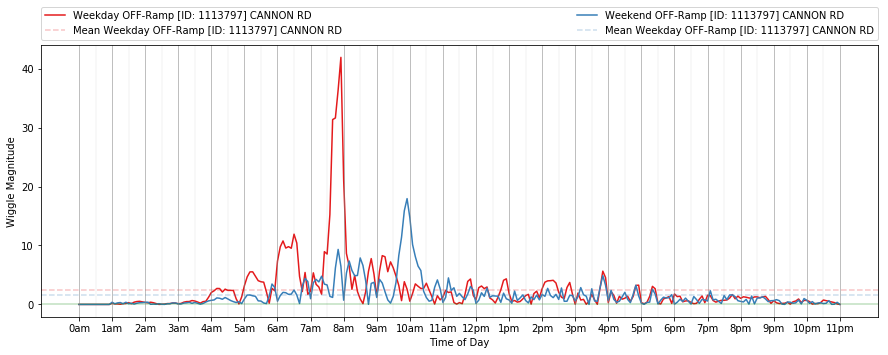

Main-Line [14.856] 1117789 - SB 5 @ SR 94 https://www.google.com/maps/place/32.712581,-117.147751


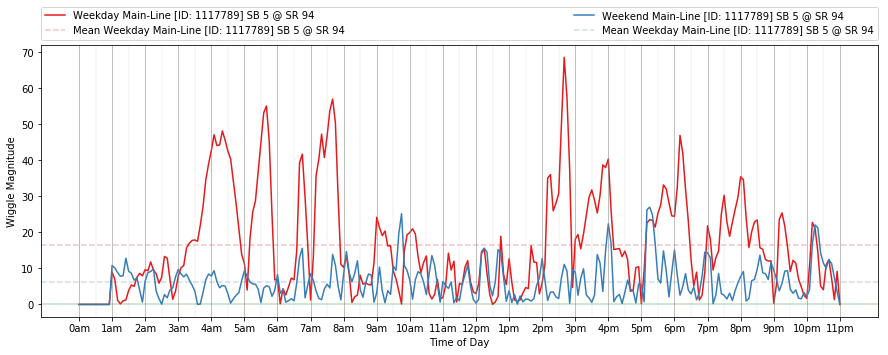

Station [1120388] not found in meta data, skipping station
Main-Line [40.483] 1108477 - SANTA FE DR https://www.google.com/maps/place/33.036347,-117.281649


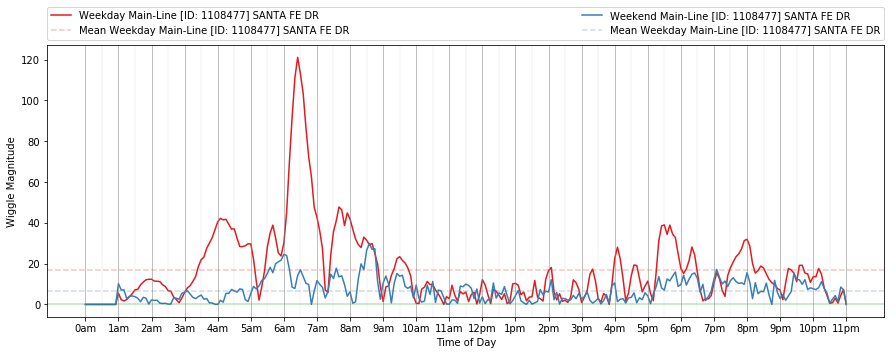

ON-Ramp [32.663] 1108435 - CARMEL VALLEY RD https://www.google.com/maps/place/32.930855,-117.241058


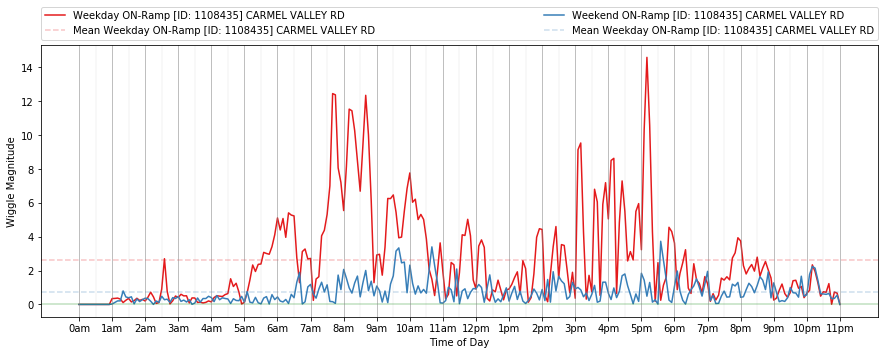

Main-Line [32.051] 1114848 - S/O SR-56 https://www.google.com/maps/place/32.922166,-117.23824


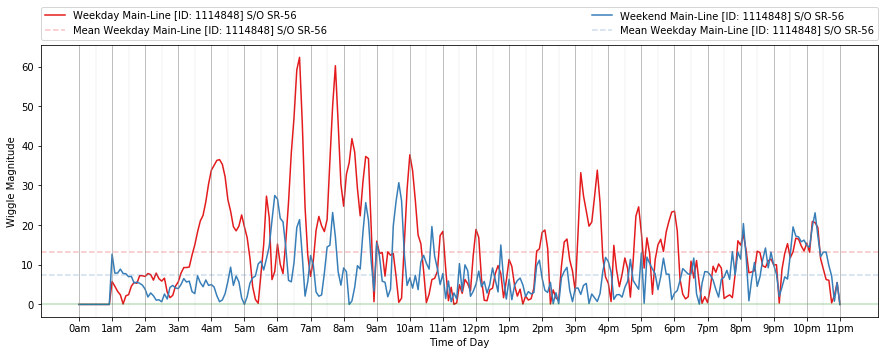

Main-Line [38.439] 1108473 - MANCHESTER AVE https://www.google.com/maps/place/33.010643,-117.265228


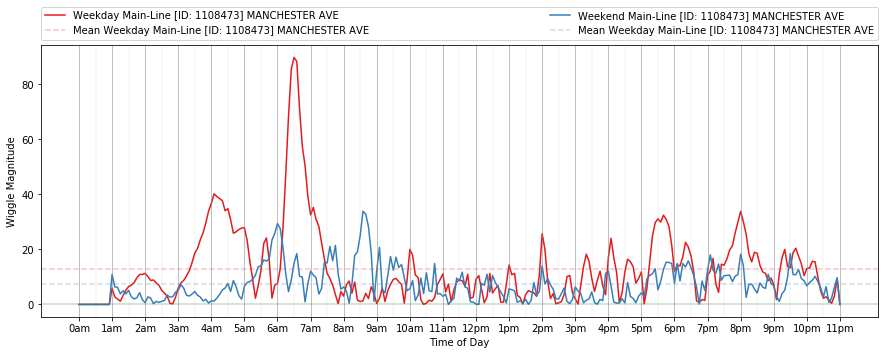

ON-Ramp [21.973] 1108712 - EB CLAIREMONT DR https://www.google.com/maps/place/32.788012,-117.207155


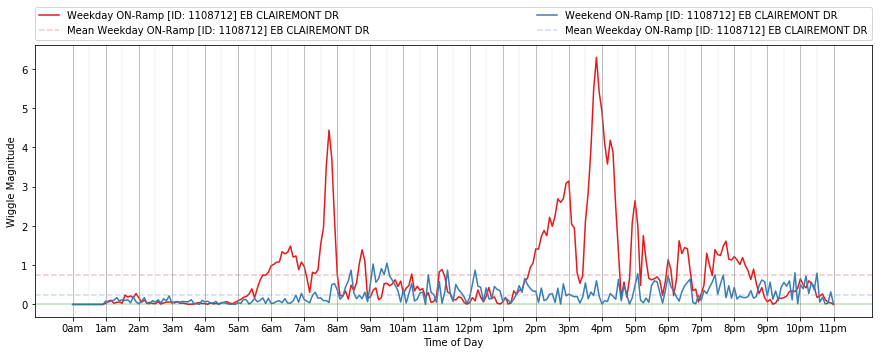

Main-Line [10.796] 1118465 - 5 SB  Civic Center https://www.google.com/maps/place/32.671761,-117.111234


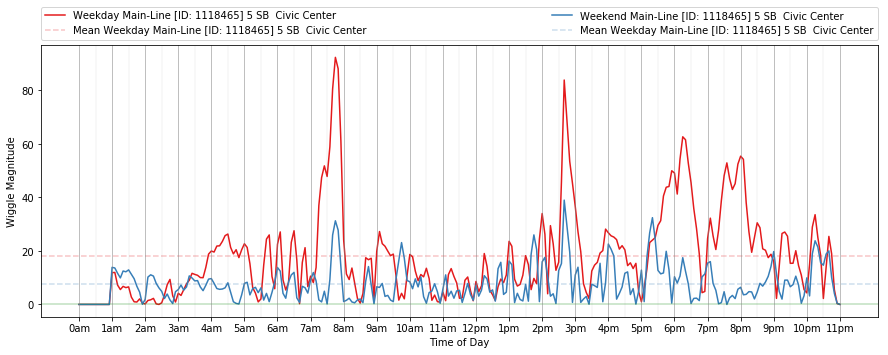

Main-Line [6.627] 1120356 - SB 5 S/O L St https://www.google.com/maps/place/32.613849,-117.091173


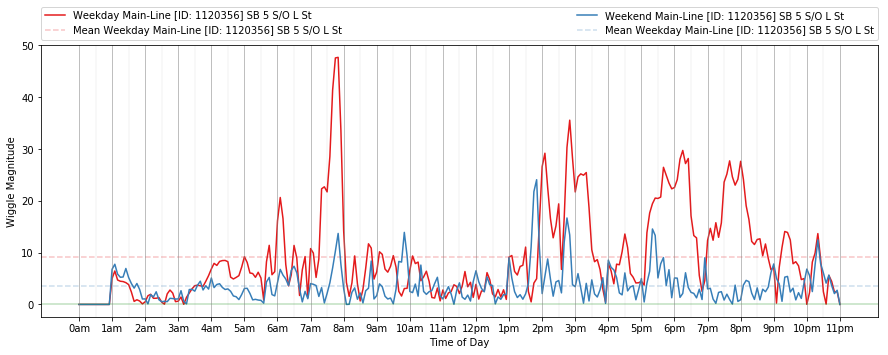

Main-Line [41.385] 1108479 - ENCINITAS BLVD https://www.google.com/maps/place/33.048438,-117.287351


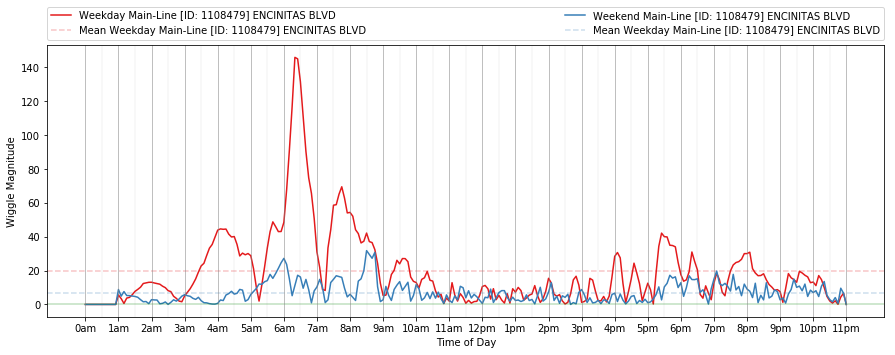

ON-Ramp [43.643] 1108726 - LA COSTA AVE https://www.google.com/maps/place/33.080188,-117.296877


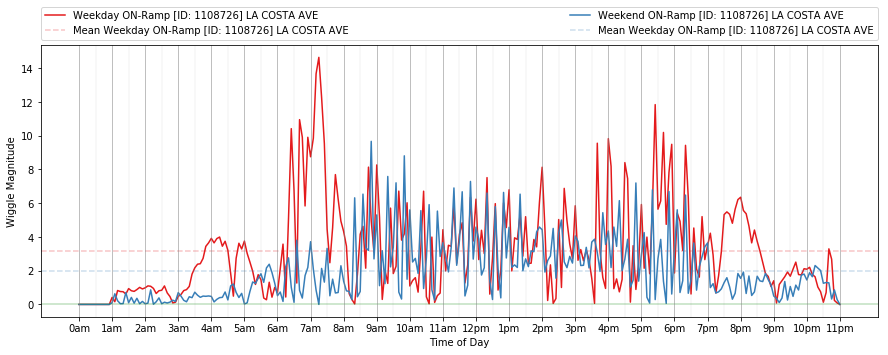

ON-Ramp [22.85] 1108694 - MISSION BAY DR https://www.google.com/maps/place/32.800051,-117.211487


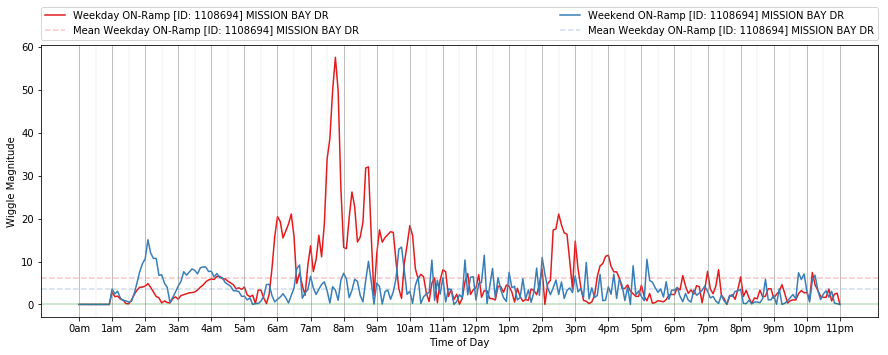

Main-Line [60.429] 1121702 - 5 SB N/O Rest Area https://www.google.com/maps/place/33.28144,-117.449446


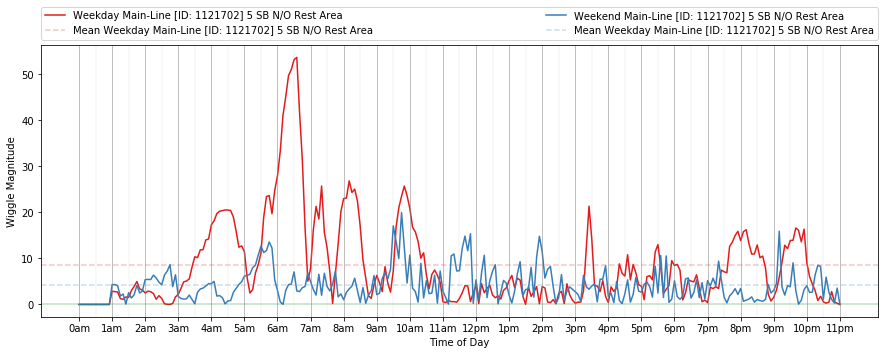

ON-Ramp [47.823] 1108662 - CANNON RD https://www.google.com/maps/place/33.134215,-117.329382


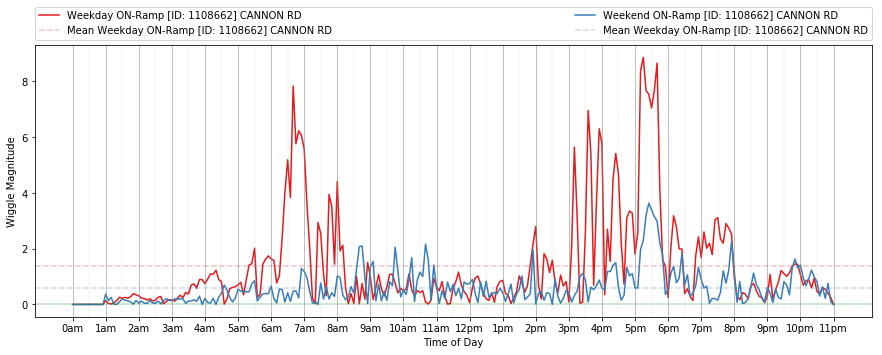

Main-Line [52.266] 1108459 - Oceanside Blvd https://www.google.com/maps/place/33.191277,-117.363281


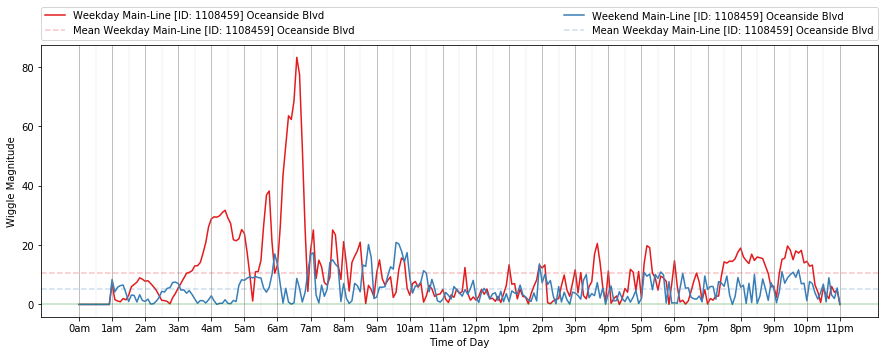

Station [1120472] not found in meta data, skipping station
Main-Line [31.517] 1120754 - Carmel Mt. To SB 5 https://www.google.com/maps/place/32.91625,-117.232541


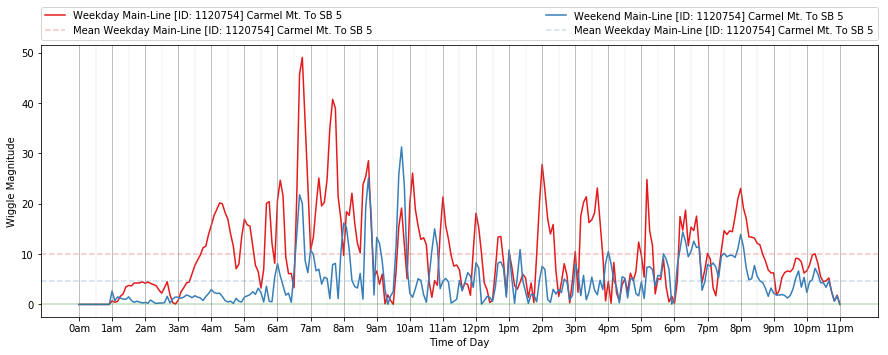

Main-Line [68.279] 1121728 - 5 SB Nuclear Plant https://www.google.com/maps/place/33.362845,-117.540736


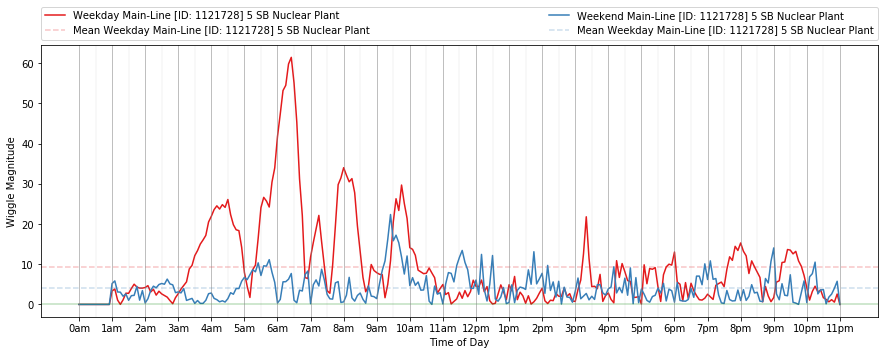

ON-Ramp [34.169] 1108432 - WB DEL MAR HEIGHTS https://www.google.com/maps/place/32.952468,-117.244298


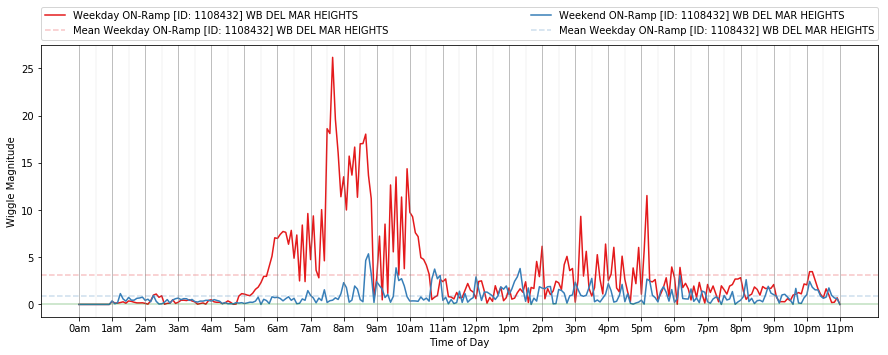

ON-Ramp [16.001] 1108418 - 5TH AVE https://www.google.com/maps/place/32.723898,-117.156068


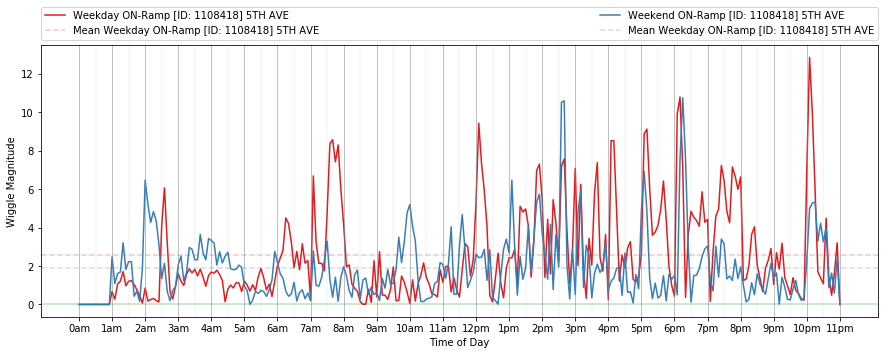

Main-Line [21.366] 1114806 - S/O CLAIRMONT DR https://www.google.com/maps/place/32.779286,-117.2086


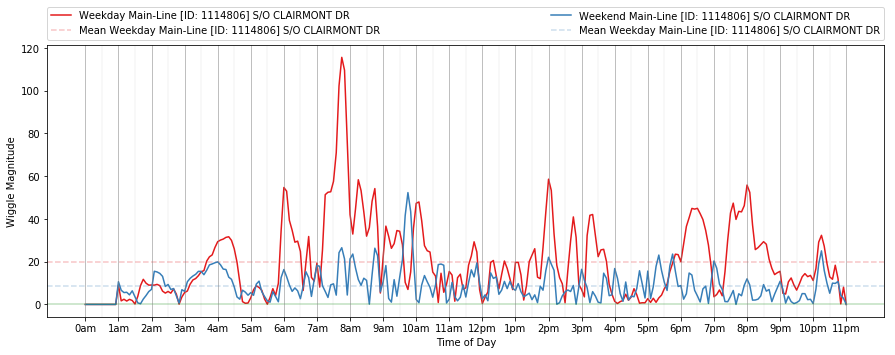

Main-Line [16.666] 1117734 - SB 5 @ Grape St. https://www.google.com/maps/place/32.725281,-117.166084


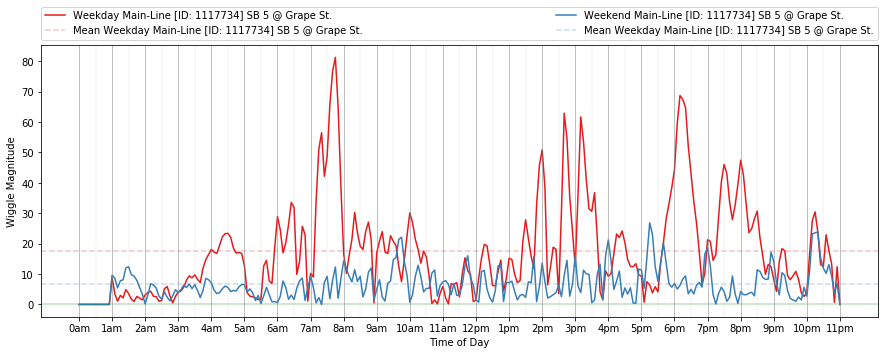

OFF-Ramp [38.439] 1100387 - MANCHESTER AVE https://www.google.com/maps/place/33.010643,-117.265228


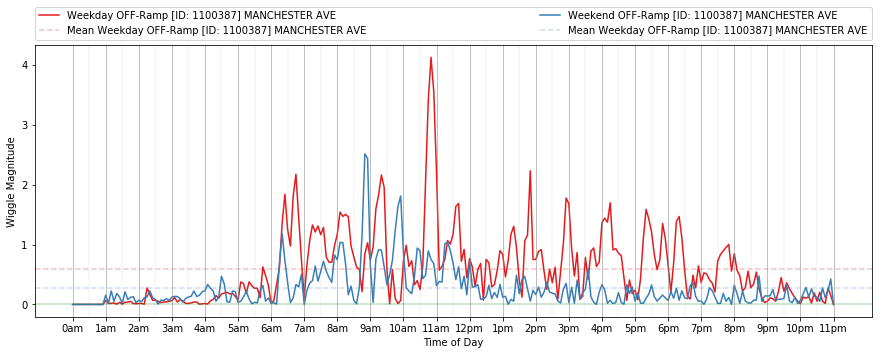

ON-Ramp [51.293] 1108462 - CASSIDY ST https://www.google.com/maps/place/33.179734,-117.353651


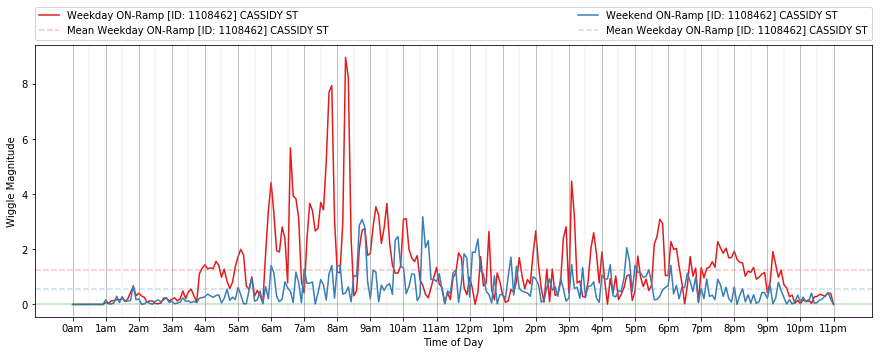

Main-Line [17.572] 1117724 - SB 5 N/O Pacific HWY https://www.google.com/maps/place/32.735815,-117.175452


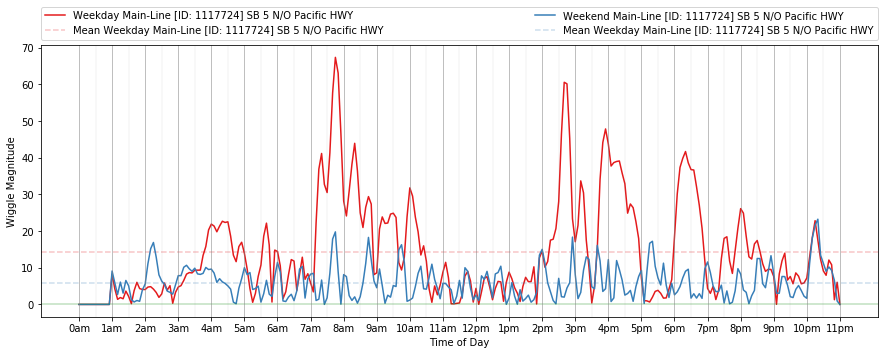

Main-Line [41.888] 1119877 - SB 5 N/O ENCINITAS https://www.google.com/maps/place/33.055523,-117.289401


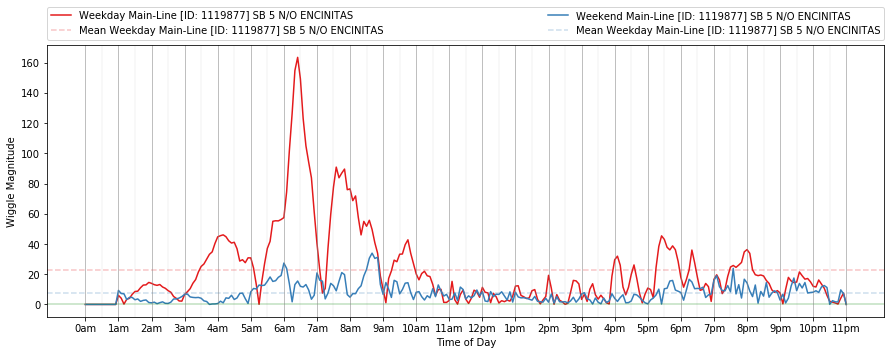

ON-Ramp [28.152] 1108497 - EB LA JOLLA VILLAGE https://www.google.com/maps/place/32.869675,-117.229543


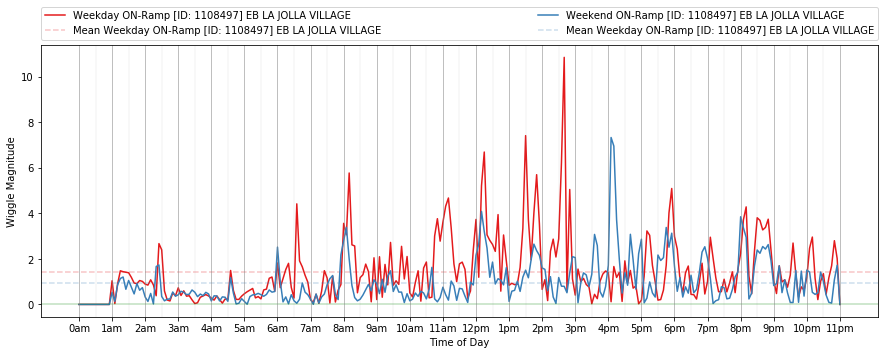

Main-Line [5.231] 1114735 - S/O MAIN ST https://www.google.com/maps/place/32.593819,-117.088714


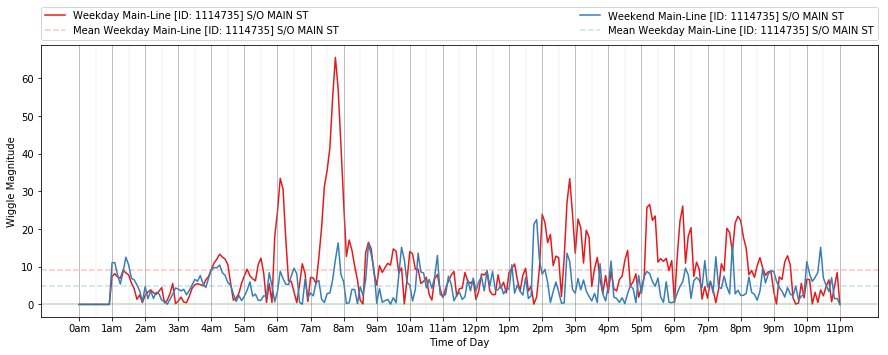

OFF-Ramp [52.266] 1113780 - OCEANSIDE BLVD https://www.google.com/maps/place/33.191277,-117.363281


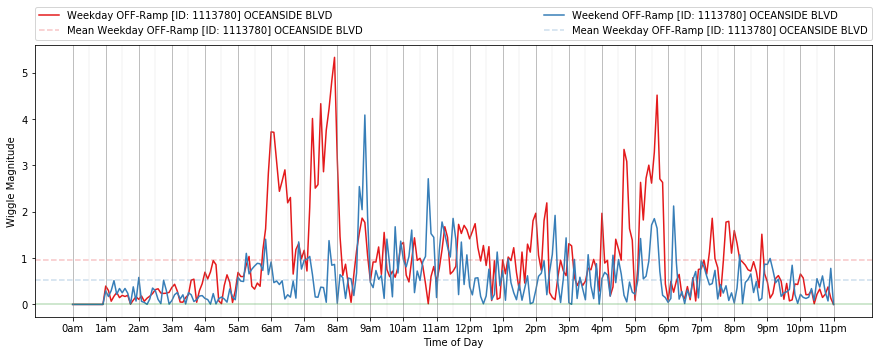

OFF-Ramp [53.158] 1113776 - WB RTE 76/MISSION https://www.google.com/maps/place/33.200618,-117.373434


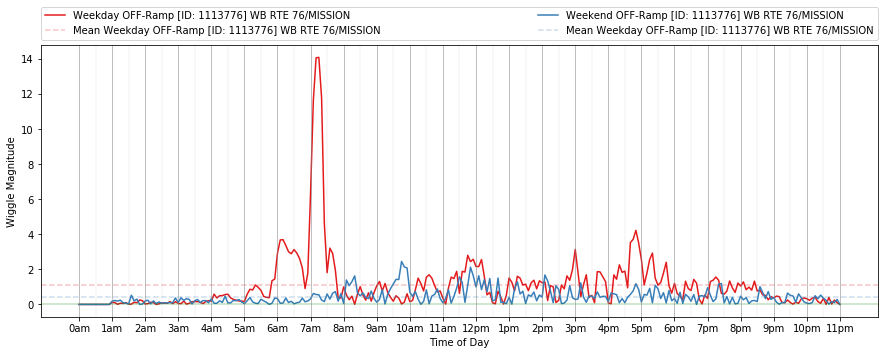

Main-Line [70.878] 1121734 - 5 SB Basilone Rd https://www.google.com/maps/place/33.383349,-117.578043


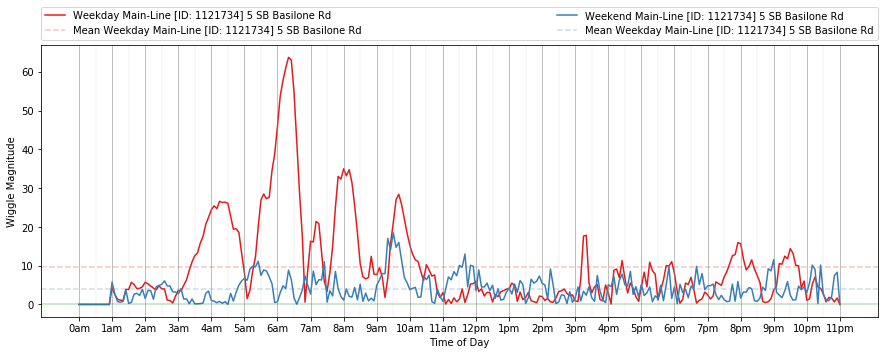

Main-Line [2.559] 1114721 - N/O DAIRY MART RD https://www.google.com/maps/place/32.561106,-117.067228


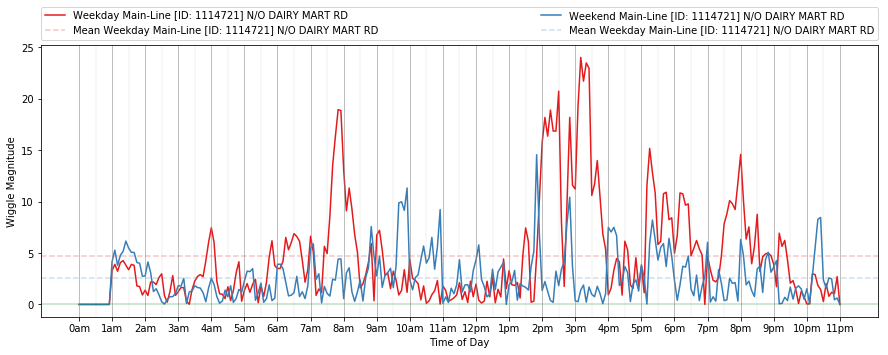

Main-Line [16.001] 1108417 - 5th Ave https://www.google.com/maps/place/32.723898,-117.156068


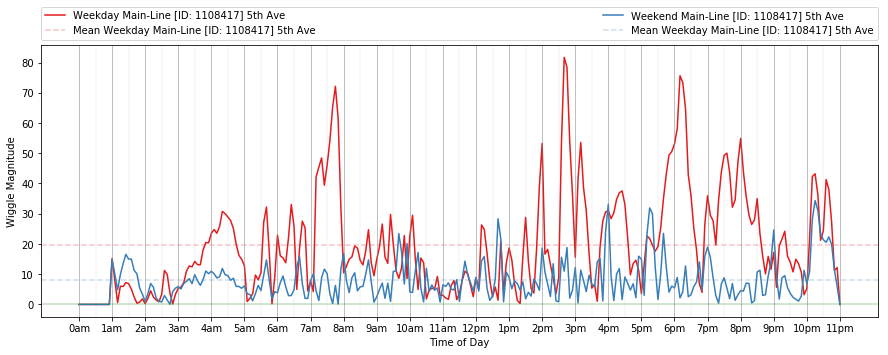

Main-Line [50.568] 1108463 - LAS FLORES DR https://www.google.com/maps/place/33.17092,-117.346811


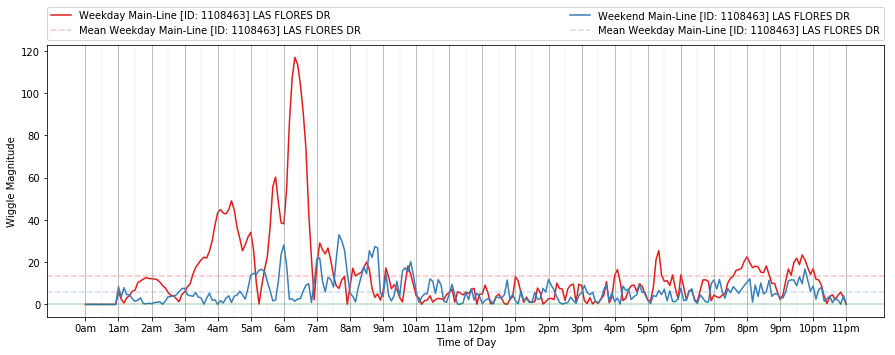

Main-Line [47.823] 1108661 - CANNON RD https://www.google.com/maps/place/33.134215,-117.329382


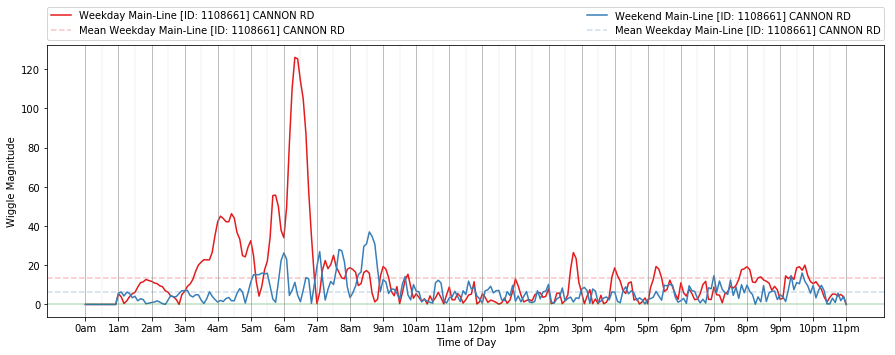

Main-Line [11.178] 1118472 - 5 SB N/O 8th St https://www.google.com/maps/place/32.67696,-117.109463


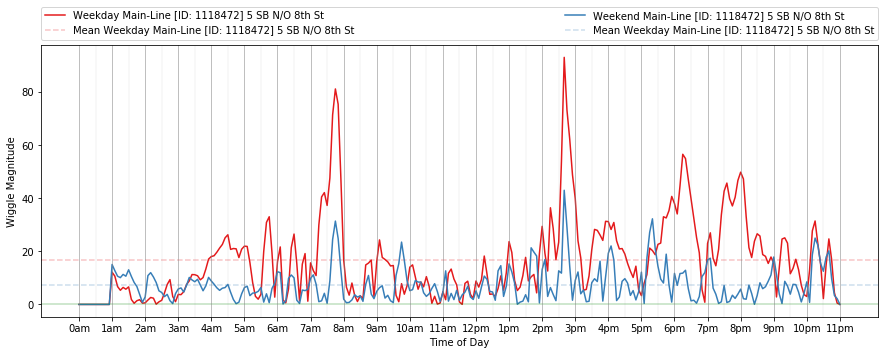

Main-Line [65.448] 1121715 - 5 NB Track Scale https://www.google.com/maps/place/33.336526,-117.503236


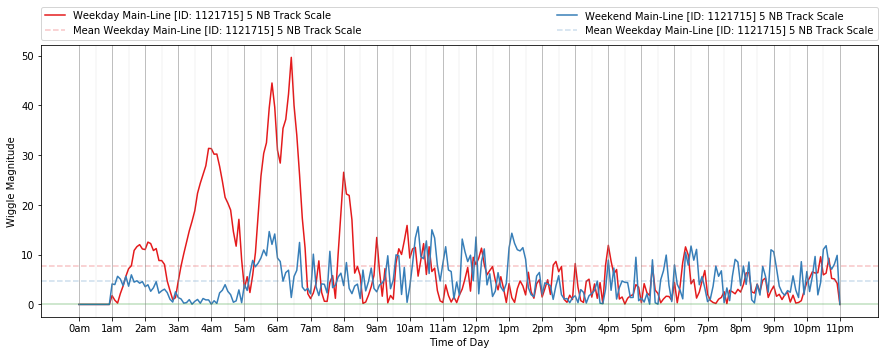

Station [1120743] not found in meta data, skipping station
OFF-Ramp [34.169] 1100377 - DEL MAR HEIGHTS RD https://www.google.com/maps/place/32.952468,-117.244298


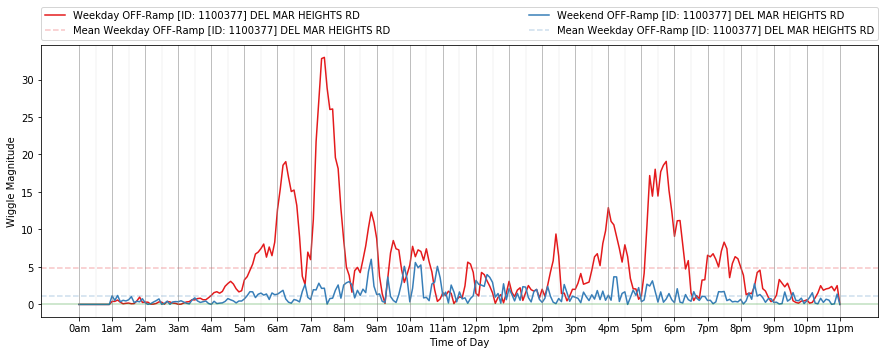

Station [1113977] not found in meta data, skipping station
ON-Ramp [53.158] 1108673 - WB RTE 76/MISSION https://www.google.com/maps/place/33.200618,-117.373434


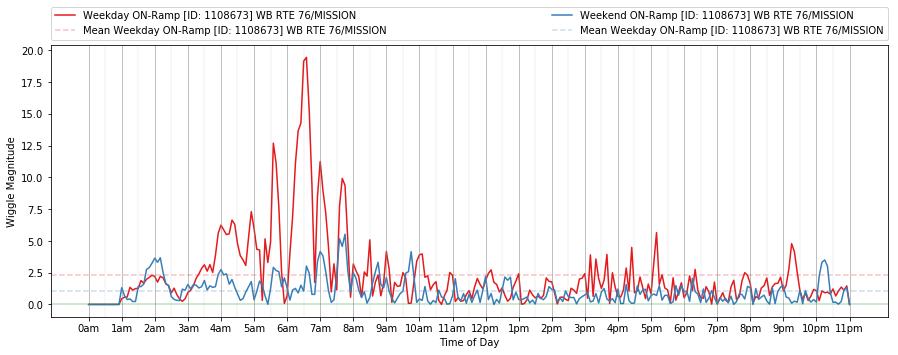

ON-Ramp [50.568] 1108464 - LAS FLORES DR https://www.google.com/maps/place/33.17092,-117.346811


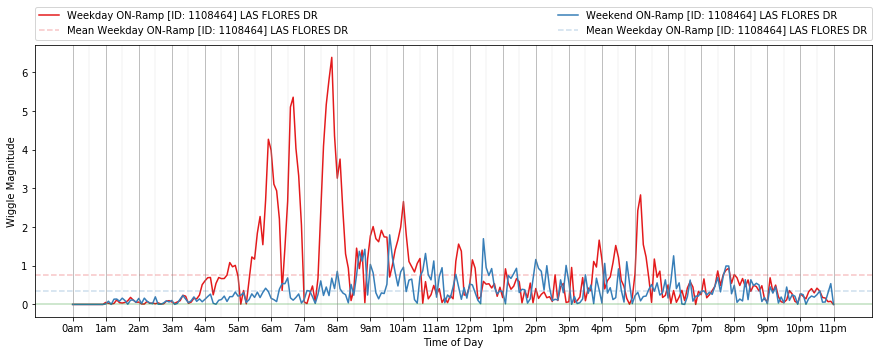

Main-Line [3.336] 1118365 - 5 SB N/0 905 https://www.google.com/maps/place/32.568952,-117.076731


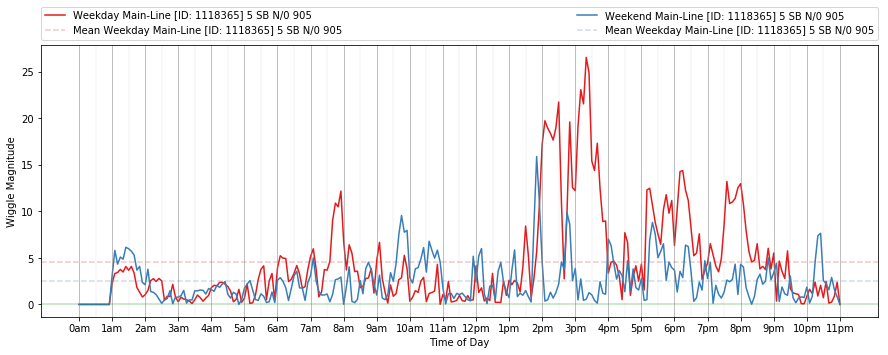

Main-Line [26.201] 1119817 - SB 5 N/O 52 https://www.google.com/maps/place/32.842472,-117.23661


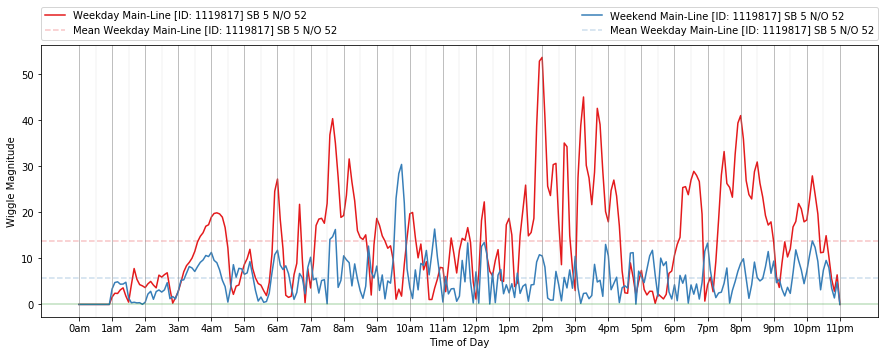

ON-Ramp [53.159] 1108674 - EB RTE 76/MISSION https://www.google.com/maps/place/33.200623,-117.37345


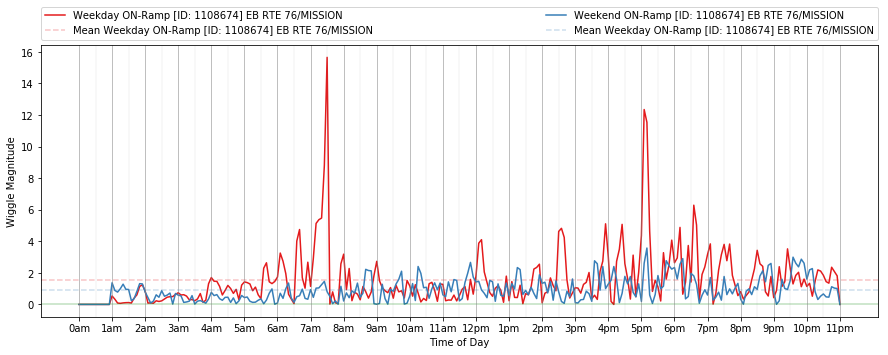

Main-Line [37.939] 1119653 - 5 S S/O MANCHESTER https://www.google.com/maps/place/33.005424,-117.259314


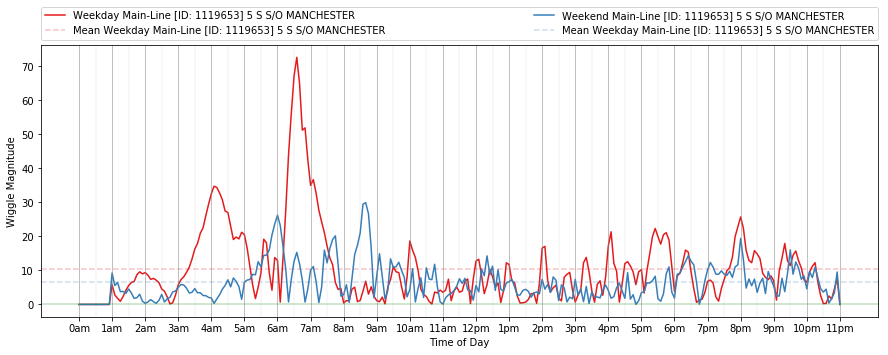

Main-Line [43.159] 1119897 - SB 5 N/O LEUCADIA https://www.google.com/maps/place/33.073371,-117.294873


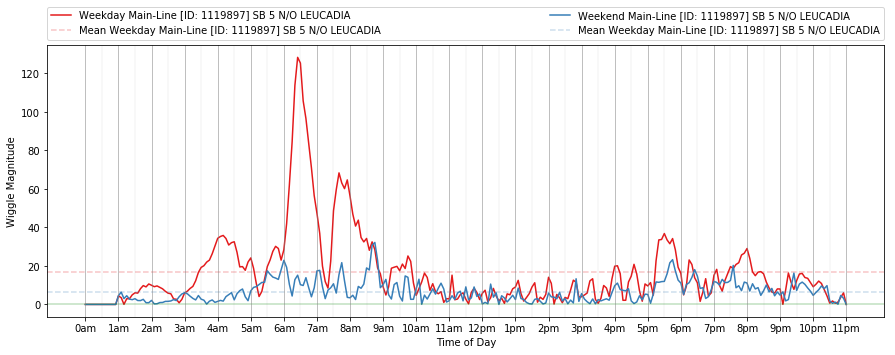

Main-Line [45.293] 1108680 - POINSETTIA LN https://www.google.com/maps/place/33.101626,-117.309439


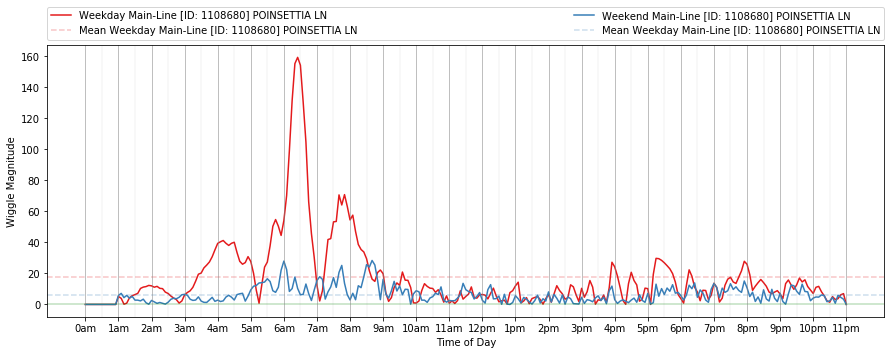

Main-Line [23.388] 1114818 - S/O BALBOA AVE https://www.google.com/maps/place/32.806773,-117.216007


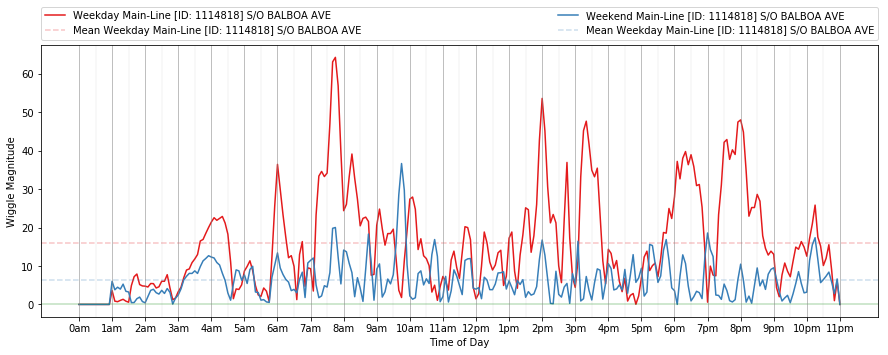

Main-Line [6.211] 1114749 - N/O PALOMAR ST https://www.google.com/maps/place/32.60787,-117.090464


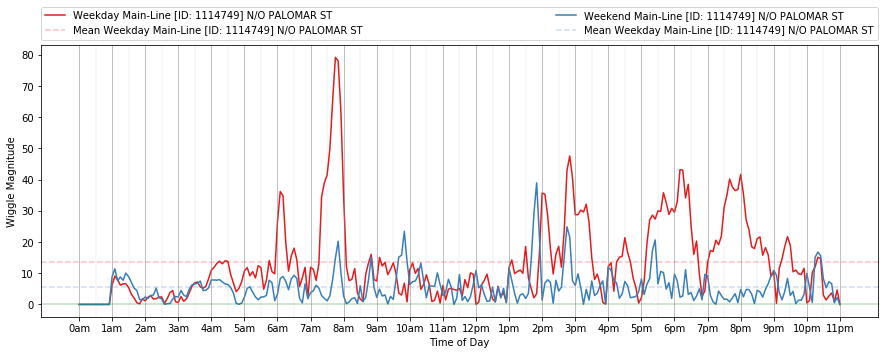

Main-Line [42.548] 1108723 - Leucadia Blvd https://www.google.com/maps/place/33.064772,-117.292309


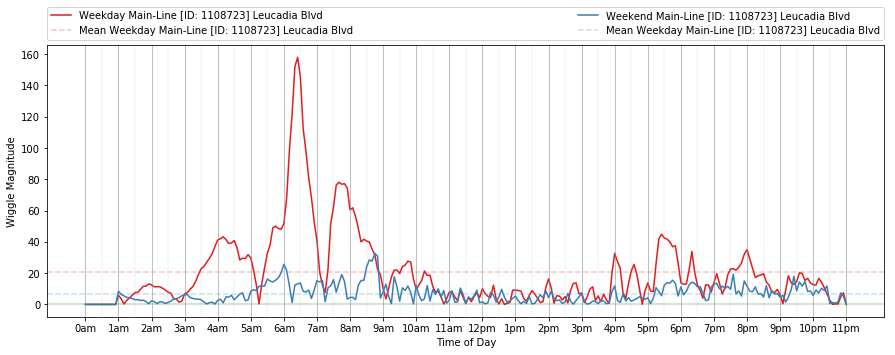

Main-Line [31.775] 1122567 - 5 SB Bypass https://www.google.com/maps/place/32.918817,-117.235742


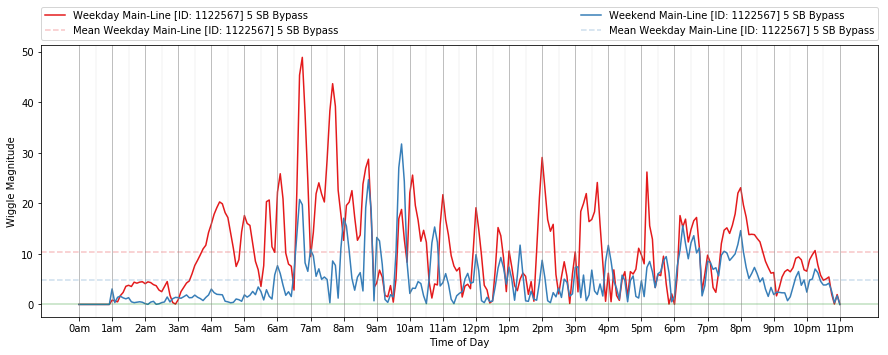

Main-Line [22.85] 1108693 - Mission Bay Dr https://www.google.com/maps/place/32.800051,-117.211487


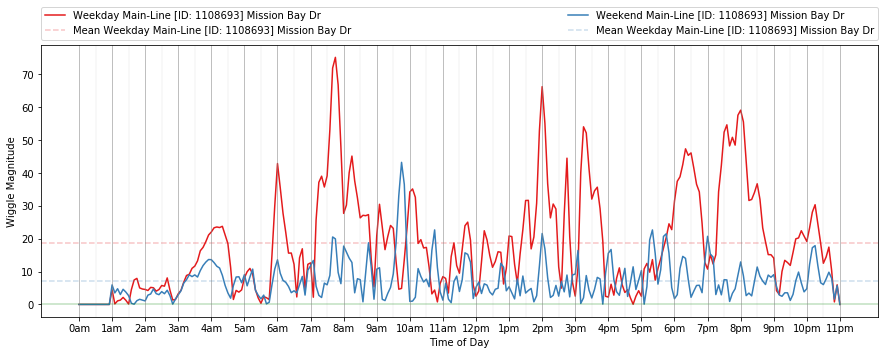

Main-Line [43.643] 1108725 - La Costa Ave https://www.google.com/maps/place/33.080188,-117.296877


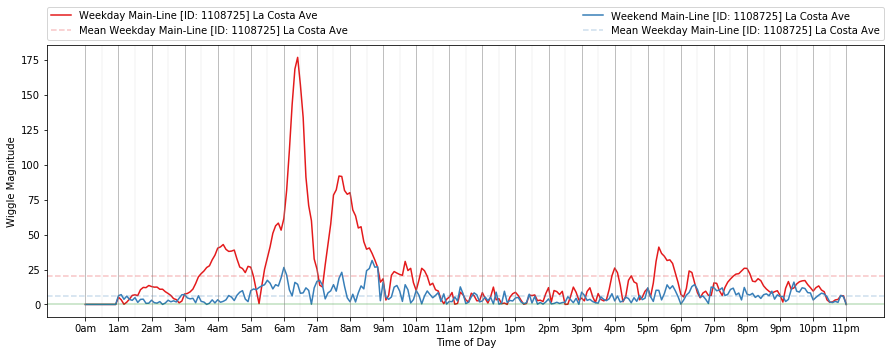

Station [1122517] not found in meta data, skipping station
OFF-Ramp [36.135] 1100381 - VIA DE LA VALLE https://www.google.com/maps/place/32.979922,-117.253241


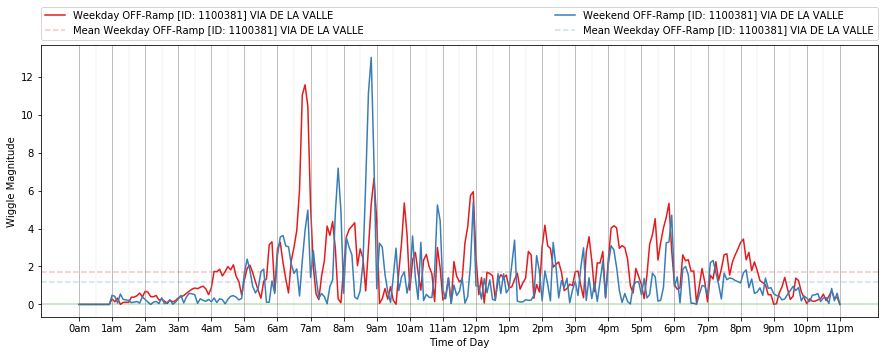

OFF-Ramp [32.663] 1100372 - CARMEL VALLEY RD https://www.google.com/maps/place/32.930855,-117.241058


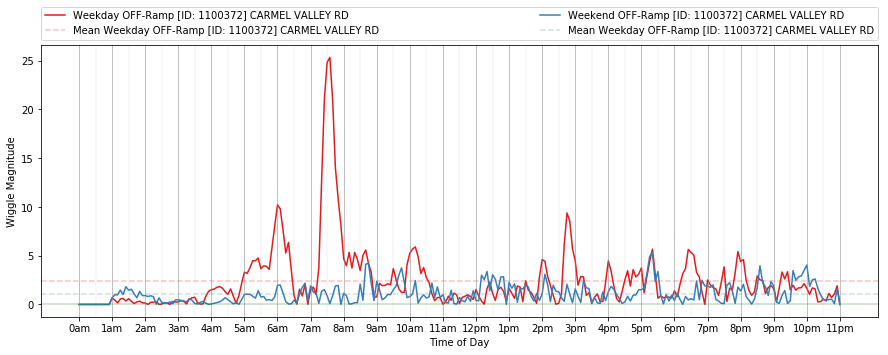

Main-Line [58.329] 1119997 - 1M S/O ALISO CREEK https://www.google.com/maps/place/33.257953,-117.426547


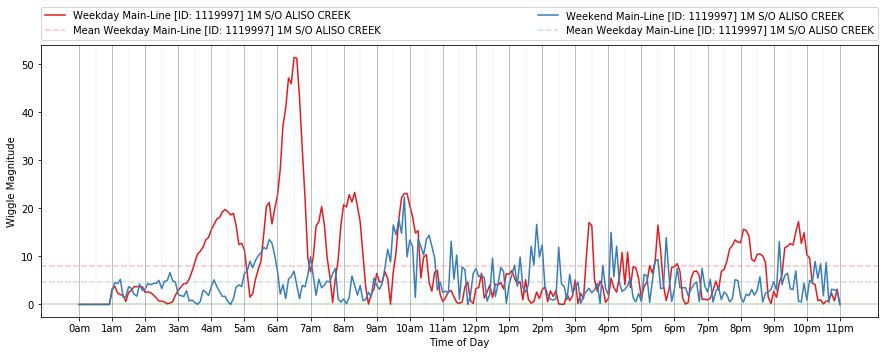

ON-Ramp [37.257] 1120740 - SB5 Lomas San Fe EB https://www.google.com/maps/place/32.995897,-117.256712


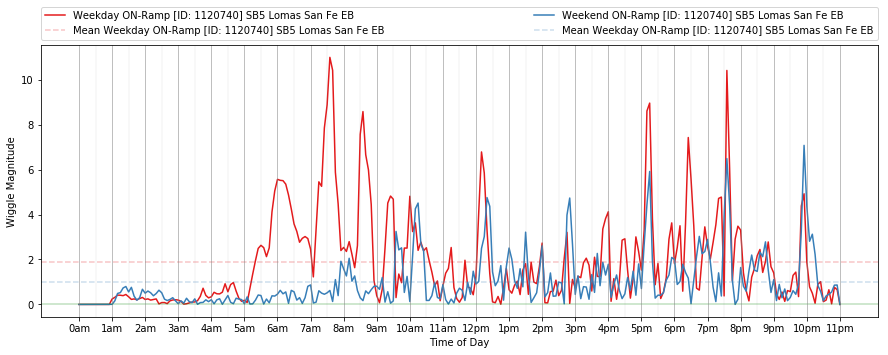

Main-Line [34.169] 1119528 - WB Del Mar Heights https://www.google.com/maps/place/32.952468,-117.244298


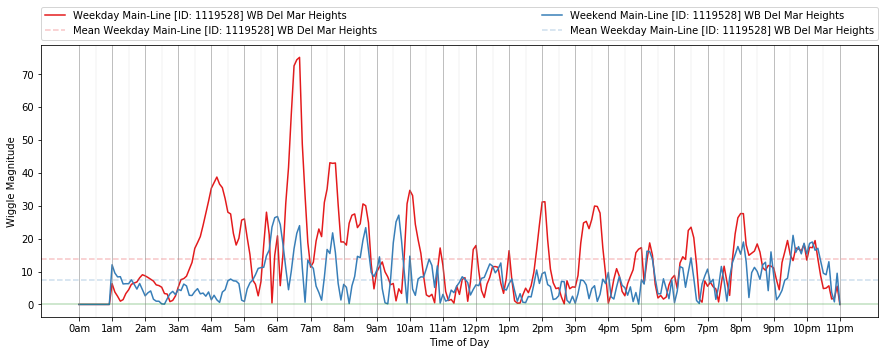

Station [1122596] not found in meta data, skipping station
Main-Line [54.292] 1122257 - SB 5 @ HARBOR DR https://www.google.com/maps/place/33.210909,-117.387715


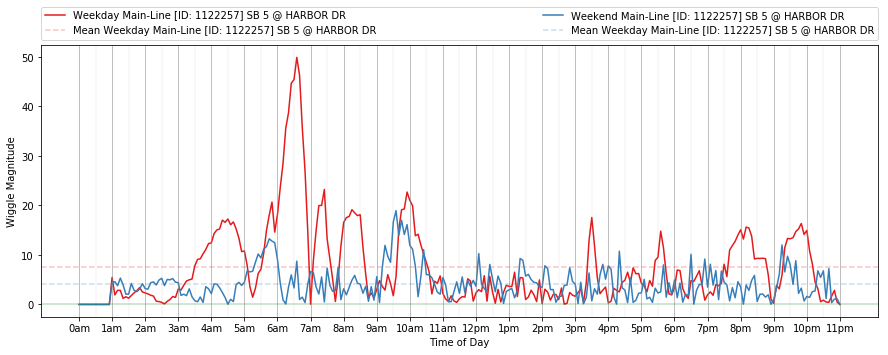

OFF-Ramp [42.548] 1113960 - LEUCADIA BLVD https://www.google.com/maps/place/33.064772,-117.292309


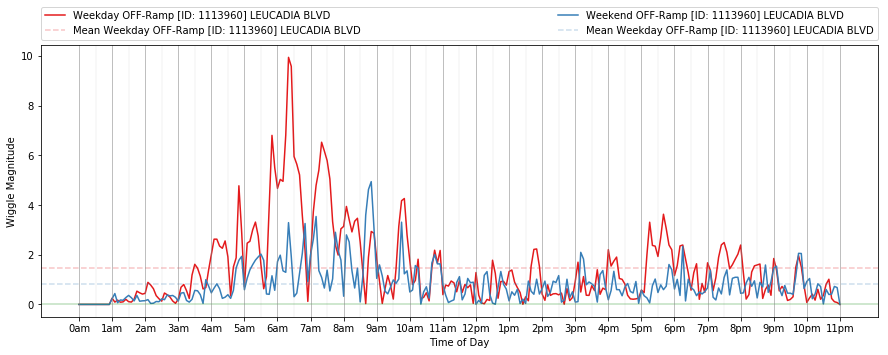

Main-Line [9.898] 1114240 - Bay Marina Dr https://www.google.com/maps/place/32.658893,-117.107675


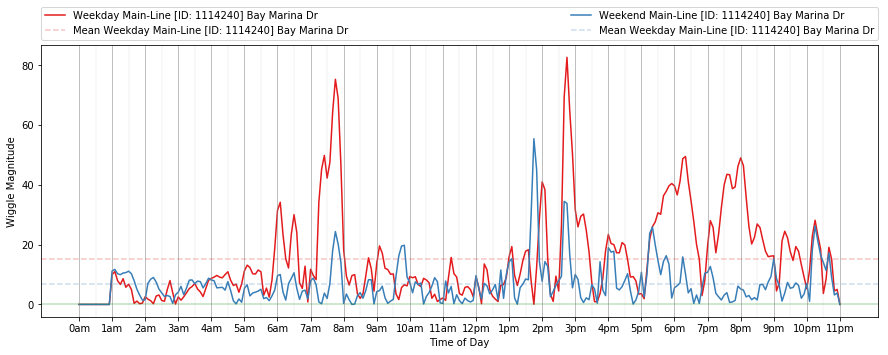

OFF-Ramp [46.955] 1100407 - PALOMAR AIRPORT RD https://www.google.com/maps/place/33.122973,-117.322702


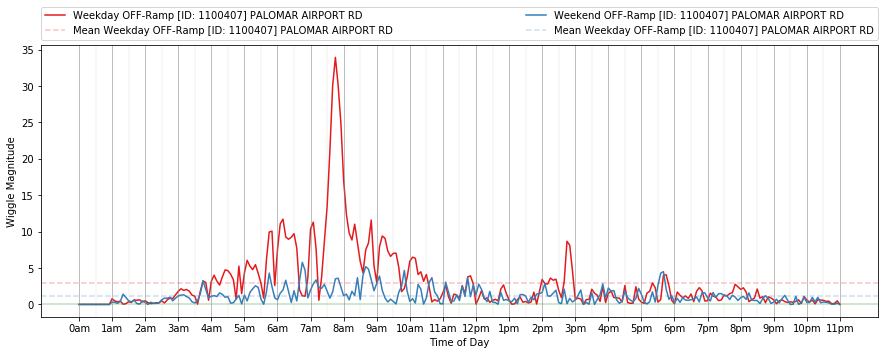

Main-Line [4.003] 1118372 - 5 SB @ Coronado Ave https://www.google.com/maps/place/32.576983,-117.083123


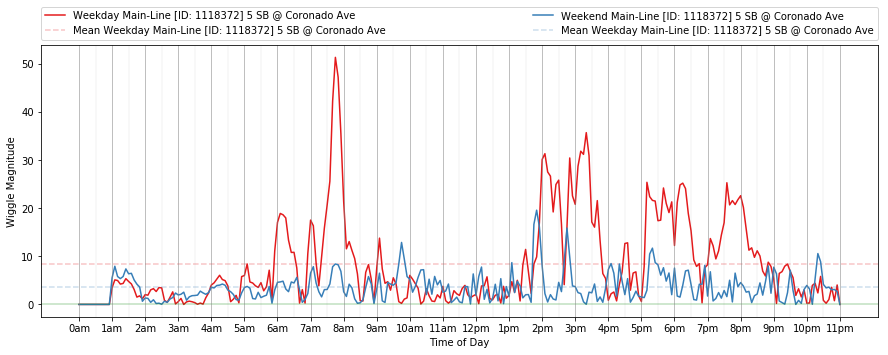

Main-Line [13.022] 1117755 - SB 5 S/O 29th https://www.google.com/maps/place/32.694358,-117.129467


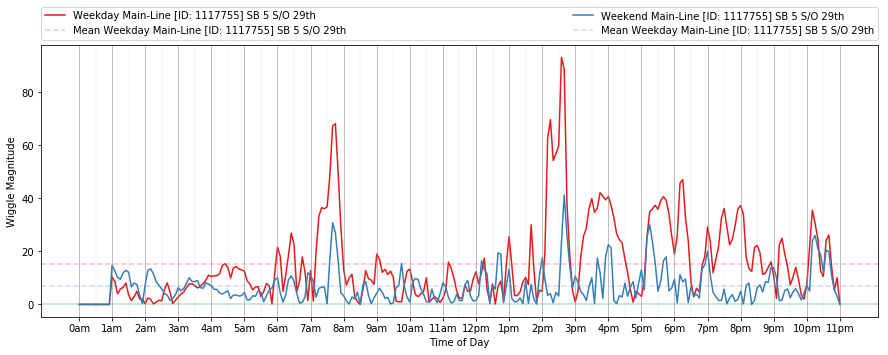

Main-Line [39.685] 1108475 - BIRMINGHAM DR https://www.google.com/maps/place/33.02625,-117.274915


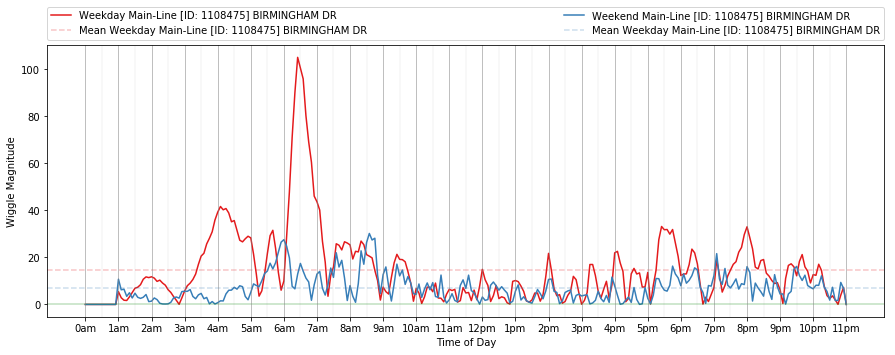

Main-Line [54.858] 1119954 - S5 N/O CAMP DEL MAR https://www.google.com/maps/place/33.218567,-117.391109


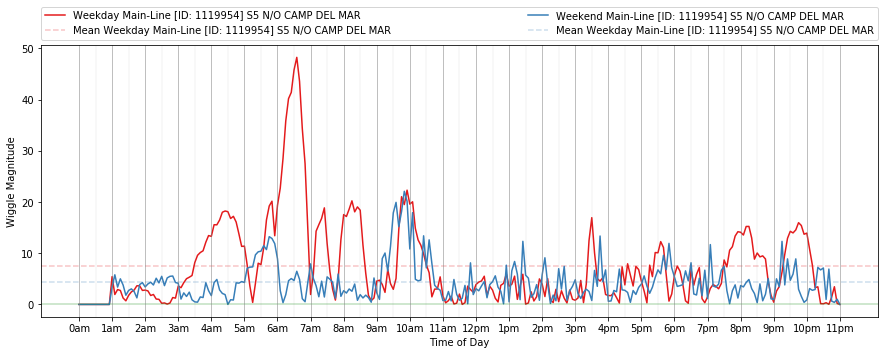

Main-Line [25.739] 1108667 - La Jolla Pkwy/SR-52 https://www.google.com/maps/place/32.836089,-117.234107


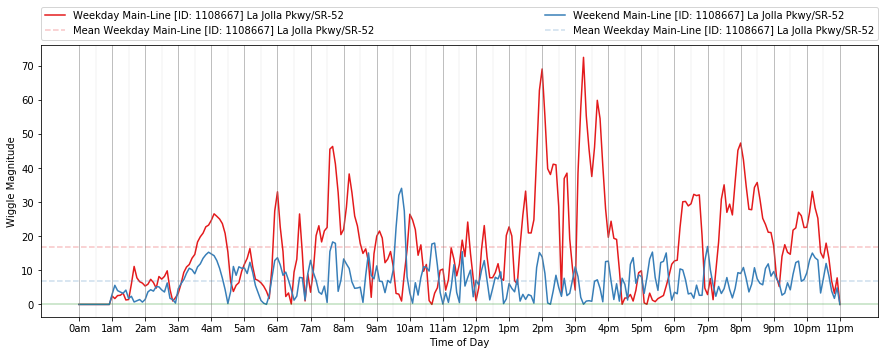

Main-Line [29.465] 1123087 - At Genesee Ave https://www.google.com/maps/place/32.888676,-117.2277


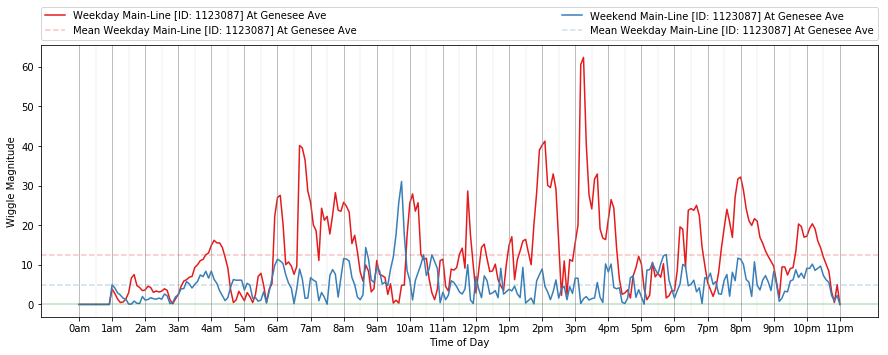

Main-Line [39.059] 1119666 - 5 S N/O VISTA VIEW https://www.google.com/maps/place/33.017512,-117.272059


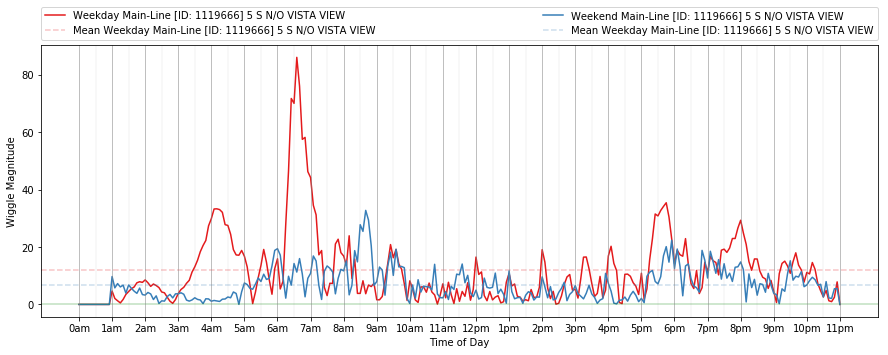

Main-Line [18.346] 1117871 - SB5 N/O WASHINGTON https://www.google.com/maps/place/32.743425,-117.1848


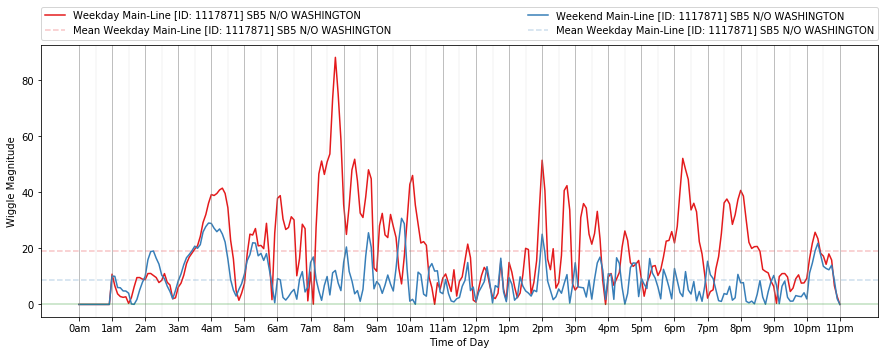

Main-Line [44.559] 1119909 - SB 5 N/O BATIQUITOS https://www.google.com/maps/place/33.092248,-117.303383


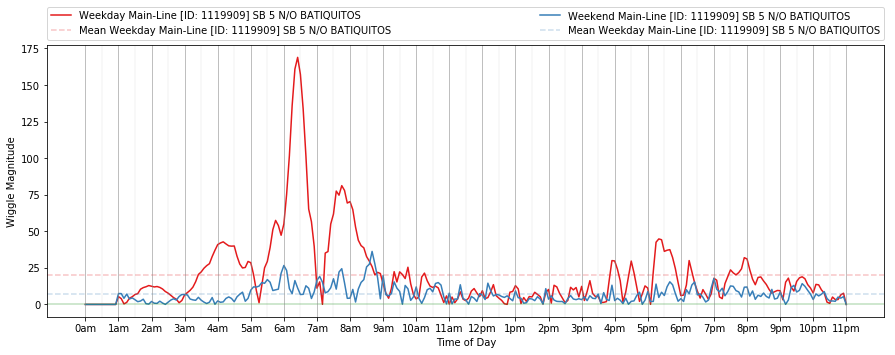

Station [1120314] not found in meta data, skipping station
Main-Line [51.293] 1108461 - CASSIDY ST https://www.google.com/maps/place/33.179734,-117.353651


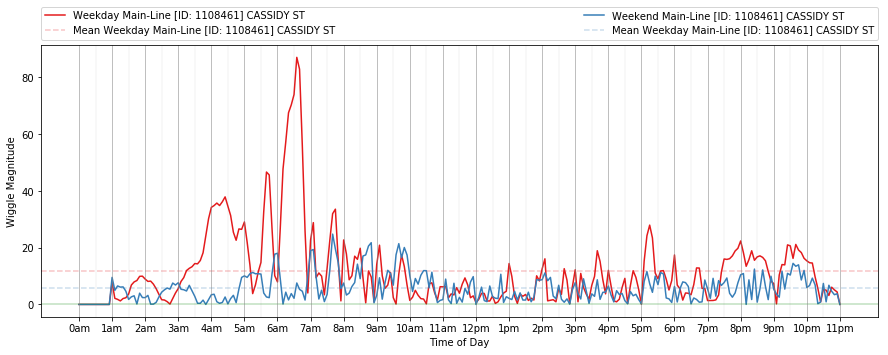

Main-Line [17.232] 1118702 - 5 SB N/O Pacific Hwy https://www.google.com/maps/place/32.731858,-117.171925


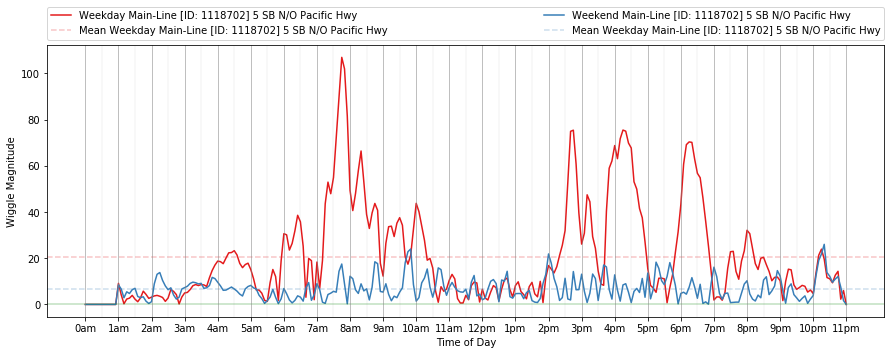

Main-Line [21.973] 1108711 - EB CLAIREMONT DR https://www.google.com/maps/place/32.788012,-117.207155


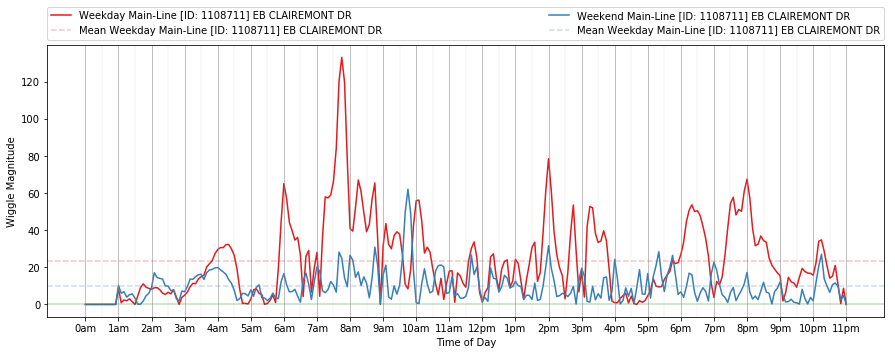

Station [1119284] not found in meta data, skipping station
ON-Ramp [36.135] 1108469 - WB VIA DE LA VALLE https://www.google.com/maps/place/32.979922,-117.253241


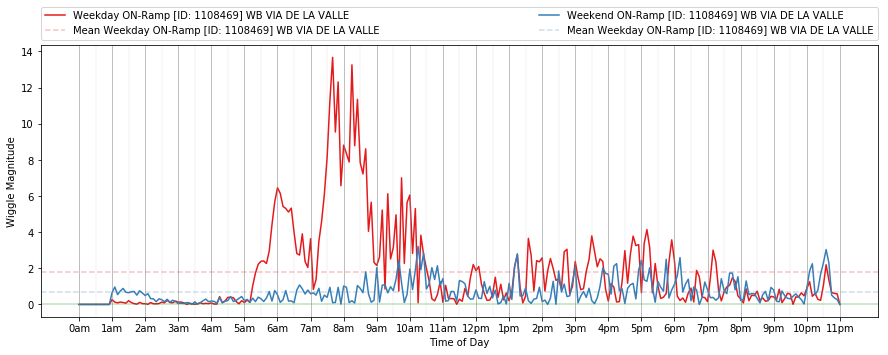

Main-Line [7.201] 1118413 - 5 SB @ J St https://www.google.com/maps/place/32.621946,-117.093171


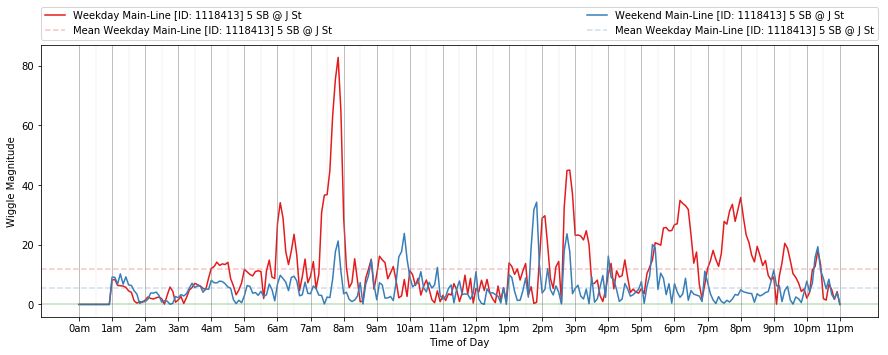

ON-Ramp [54.292] 1122250 - SB 5 @ HARBOR DR https://www.google.com/maps/place/33.210909,-117.387715


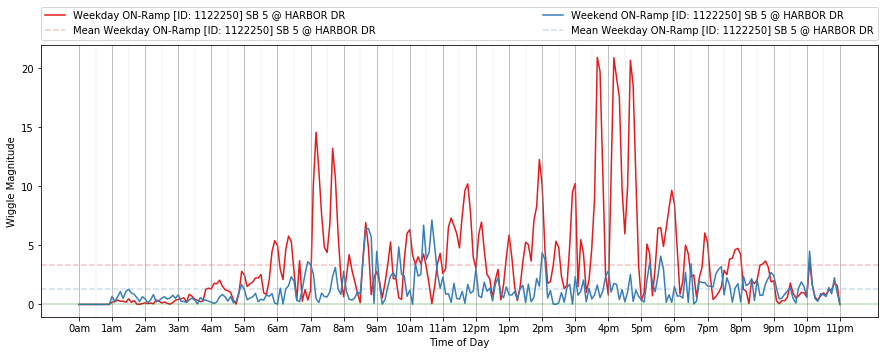

Main-Line [18.05] 1108609 - HANCOCK ST https://www.google.com/maps/place/32.741281,-117.180454


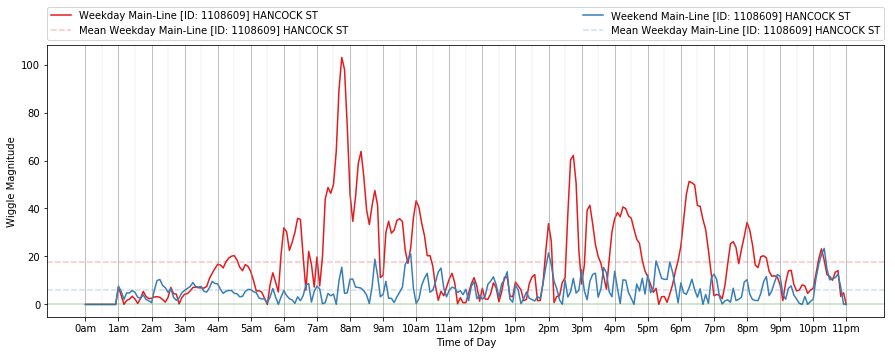

Station [1122561] not found in meta data, skipping station
Main-Line [32.663] 1108434 - CARMEL VALLEY RD https://www.google.com/maps/place/32.930855,-117.241058


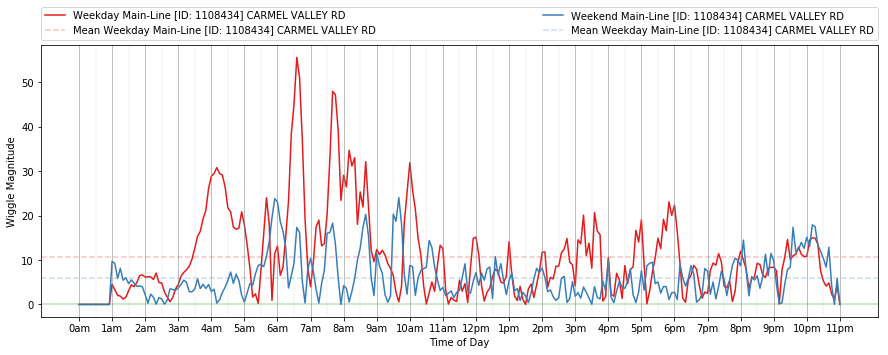

Station [1122584] not found in meta data, skipping station
ON-Ramp [37.255] 1108472 - LOMAS SANTA FE DR https://www.google.com/maps/place/32.995868,-117.256708


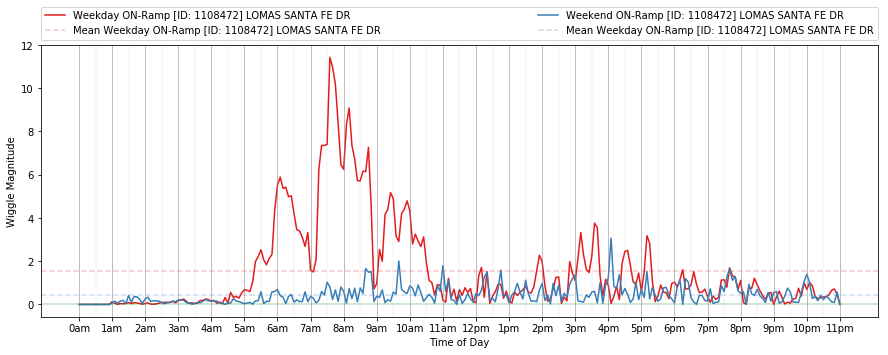

OFF-Ramp [49.948] 1113791 - CARLSBAD VILLAGE DR https://www.google.com/maps/place/33.162818,-117.342266


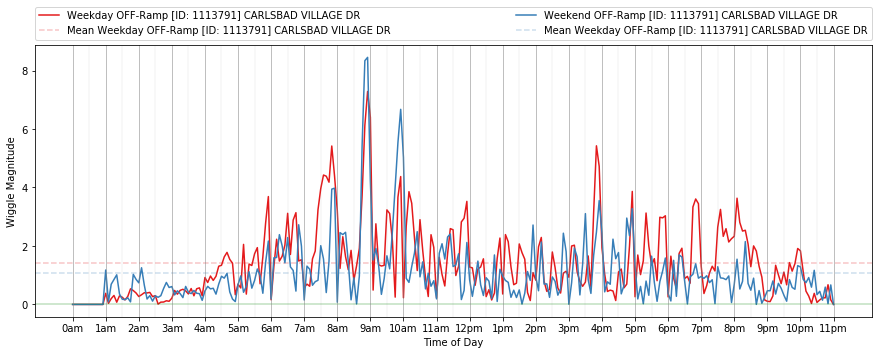

Main-Line [19.156] 1117818 - SB 5 N/O OLD TOWN https://www.google.com/maps/place/32.749919,-117.196234


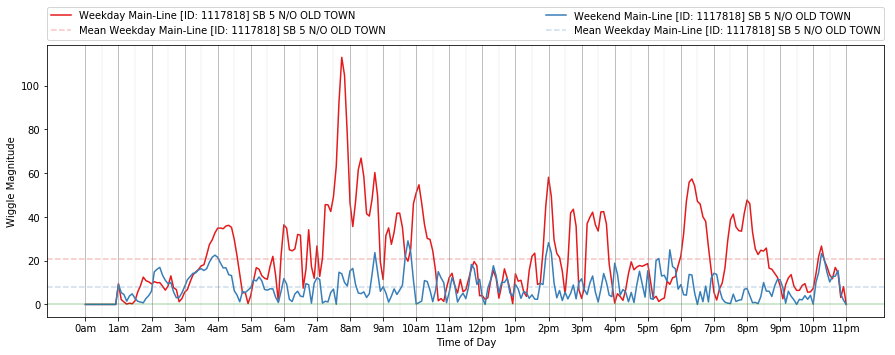

Main-Line [32.324] 1122583 - 5 SB S/O 56 https://www.google.com/maps/place/32.925907,-117.239661


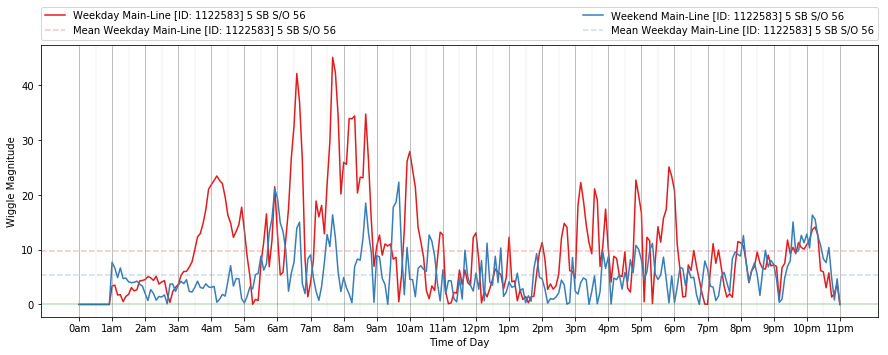

OFF-Ramp [21.973] 1100353 - CLAIREMONT DR https://www.google.com/maps/place/32.788012,-117.207155


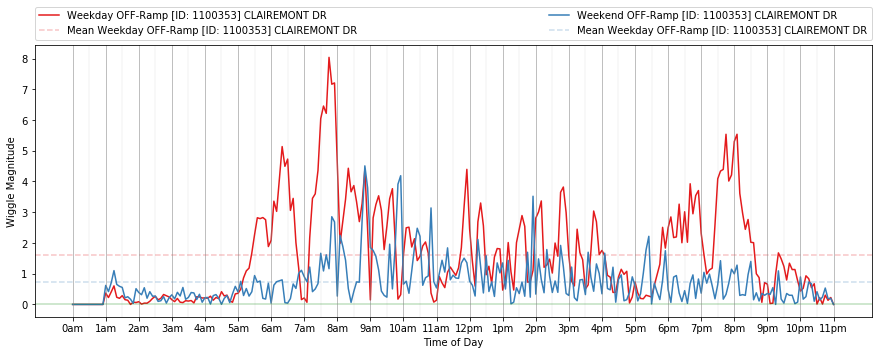

ON-Ramp [45.293] 1108681 - POINSETTIA LN https://www.google.com/maps/place/33.101626,-117.309439


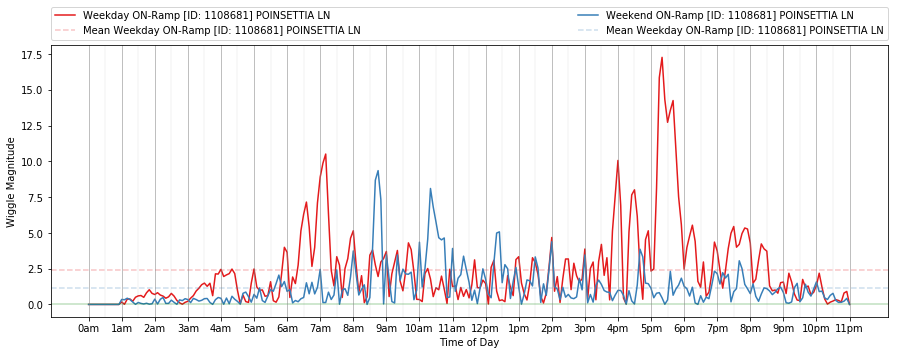

ON-Ramp [36.133] 1108470 - EB VIA DE LA VALLE https://www.google.com/maps/place/32.979894,-117.25323


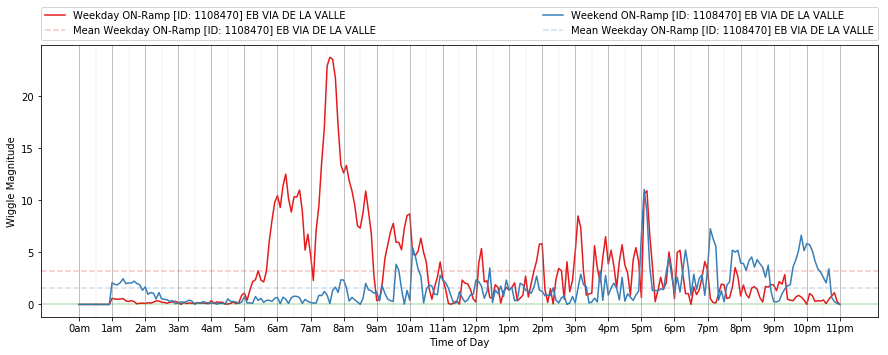

OFF-Ramp [43.643] 1113803 - LA COSTA AVE https://www.google.com/maps/place/33.080188,-117.296877


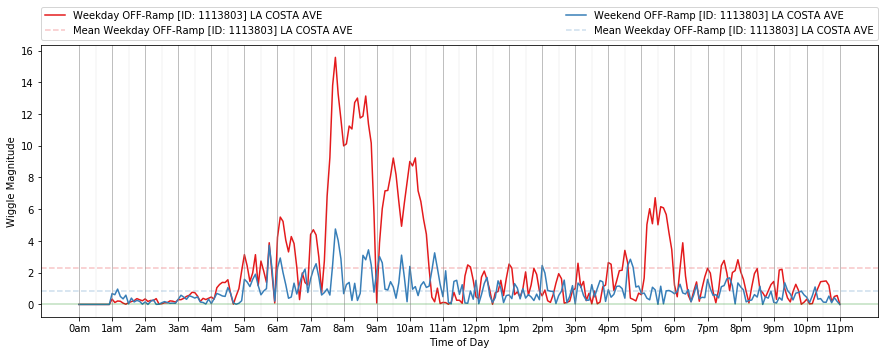

Main-Line [46.955] 1108685 - WB PALOMAR AIRPORT https://www.google.com/maps/place/33.122973,-117.322702


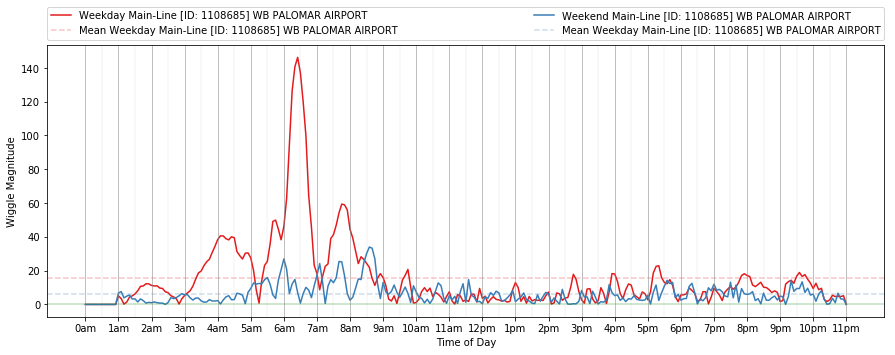

OFF-Ramp [40.483] 1100393 - SANTA FE DR https://www.google.com/maps/place/33.036347,-117.281649


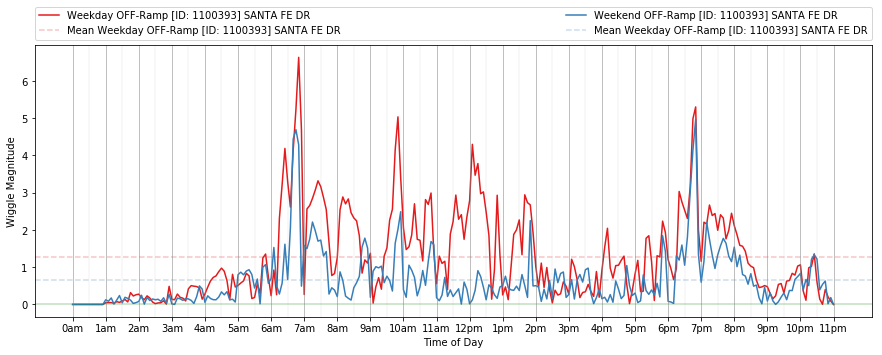

OFF-Ramp [37.255] 1100384 - LOMAS SANTA FE DR https://www.google.com/maps/place/32.995868,-117.256708


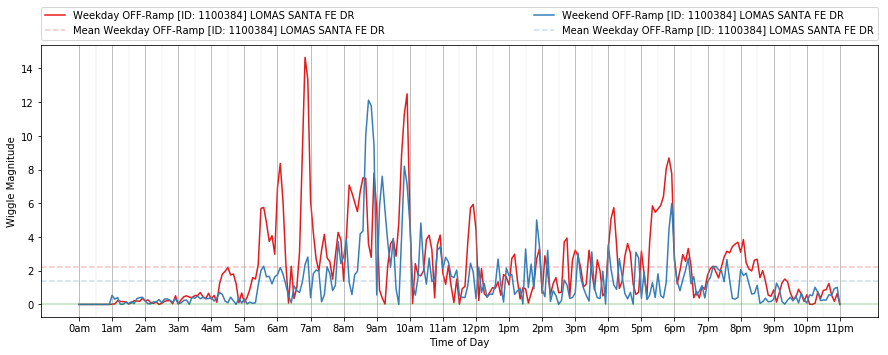

Main-Line [23.541] 1114283 - 1.48 M S/O SR-52 https://www.google.com/maps/place/32.80859,-117.217482


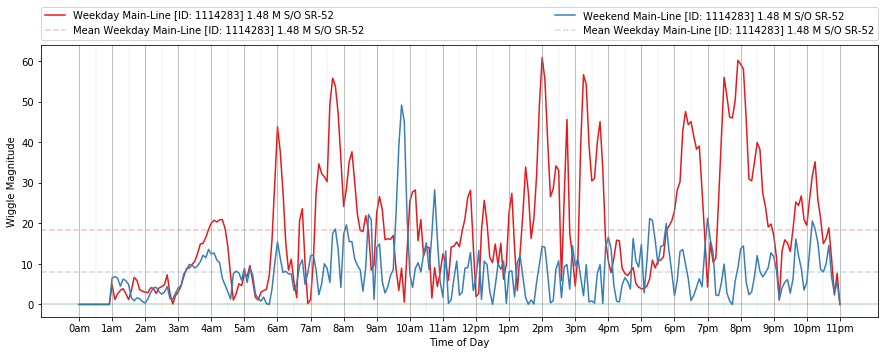

Station [1113026] not found in meta data, skipping station
Main-Line [12.113] 1118076 - SB I5 S/O I15 https://www.google.com/maps/place/32.688779,-117.116159


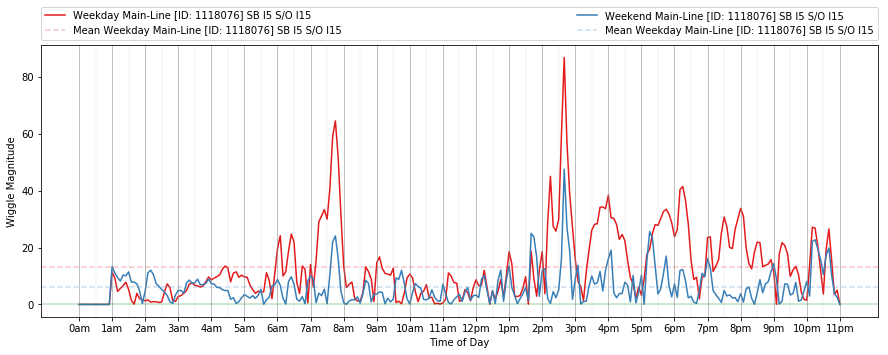

Main-Line [30.812] 1114660 - S/B AT JCT I-805 https://www.google.com/maps/place/32.907588,-117.226265


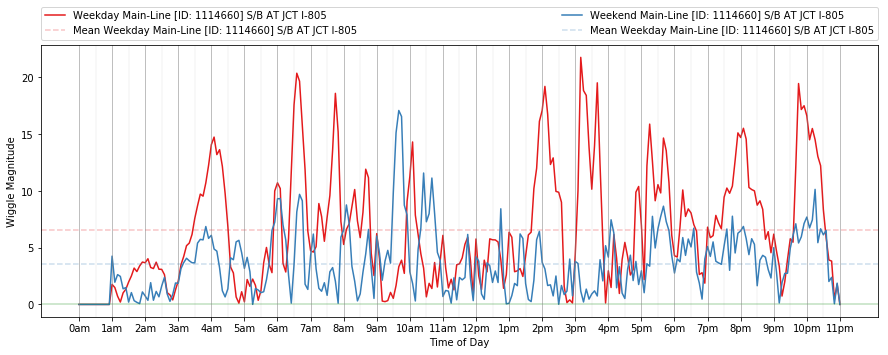

OFF-Ramp [26.621] 1100363 - GILMAN DR to 5SB https://www.google.com/maps/place/32.848532,-117.235725


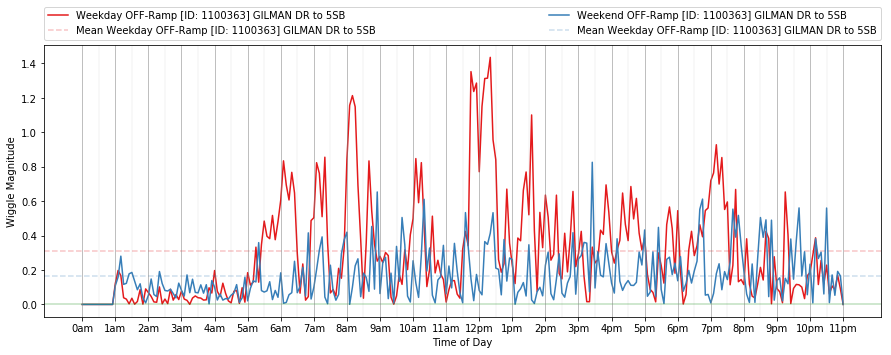

ON-Ramp [46.955] 1108686 - WB PALOMAR AIRPORT https://www.google.com/maps/place/33.122973,-117.322702


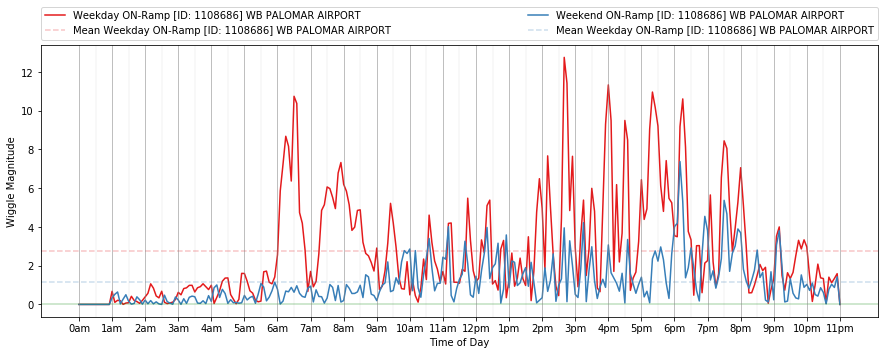

ON-Ramp [52.266] 1108460 - OCEANSIDE BLVD https://www.google.com/maps/place/33.191277,-117.363281


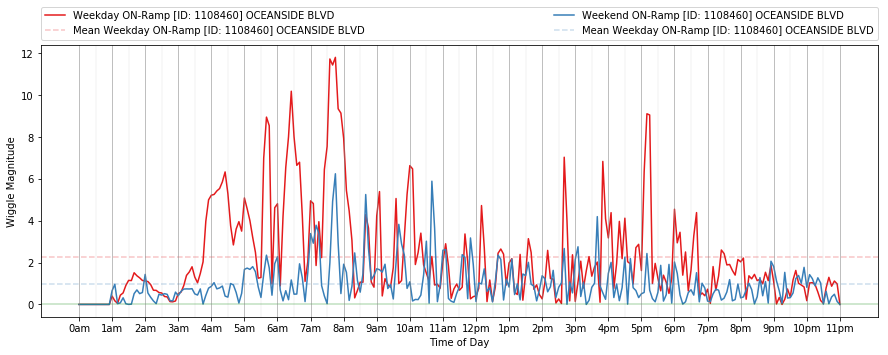

Station [1120374] not found in meta data, skipping station
OFF-Ramp [28.355] 1100369 - LA JOLLA VILLAGE DR https://www.google.com/maps/place/32.87259,-117.229295


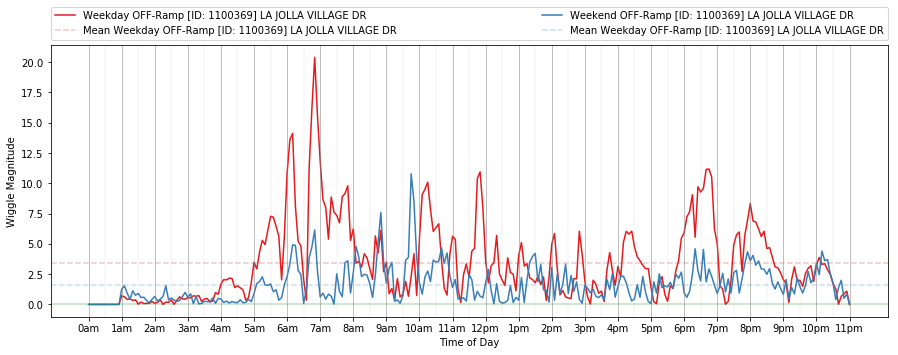

Main-Line [65.449] 1121722 - 5 SB Truck Scales https://www.google.com/maps/place/33.336536,-117.503249


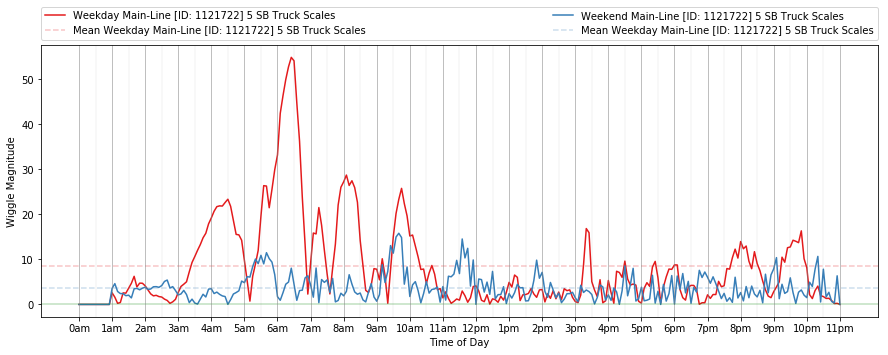

Main-Line [38.69] 1114854 - N/O MANCHESTER AVE https://www.google.com/maps/place/33.013284,-117.268215


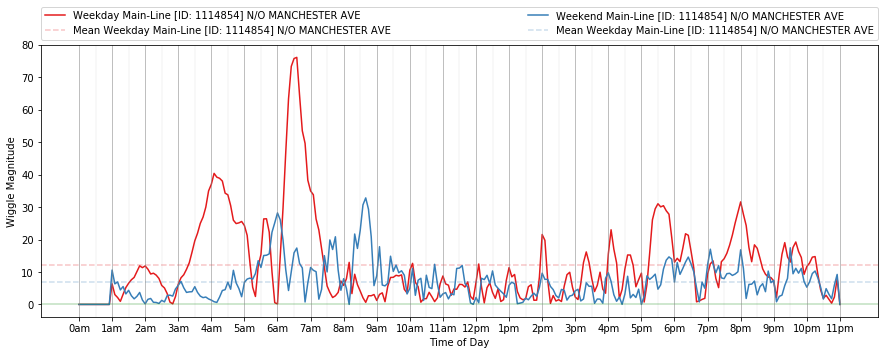

ON-Ramp [40.483] 1108478 - SANTA FE DR https://www.google.com/maps/place/33.036347,-117.281649


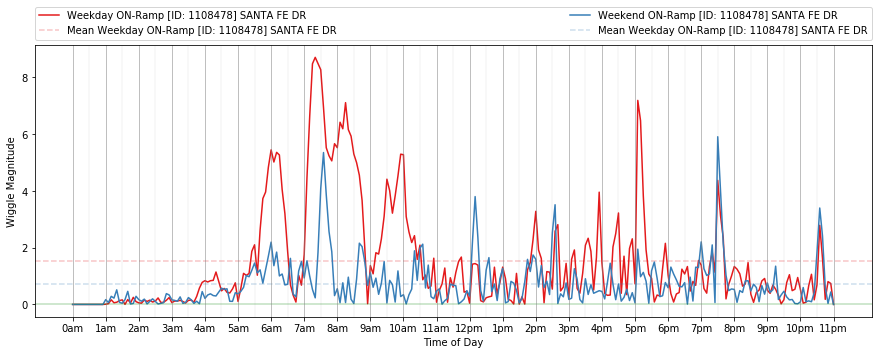

Main-Line [12.748] 1114261 - 5 SB N/O SR-15 https://www.google.com/maps/place/32.694108,-117.124841


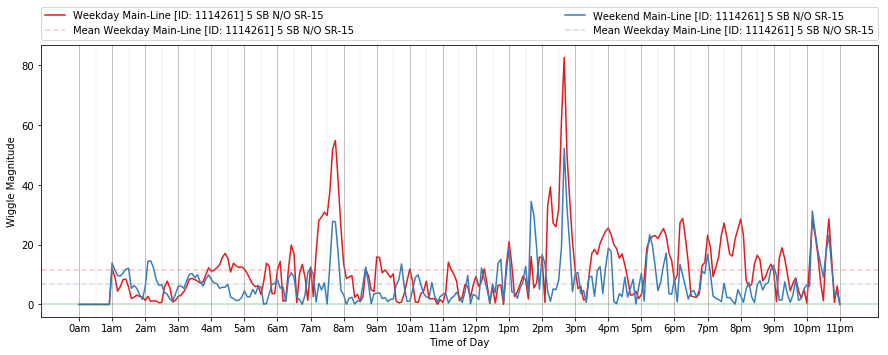

Main-Line [30.532] 1123072 - 5 S Bypass S/O 5/805 https://www.google.com/maps/place/32.903777,-117.224665


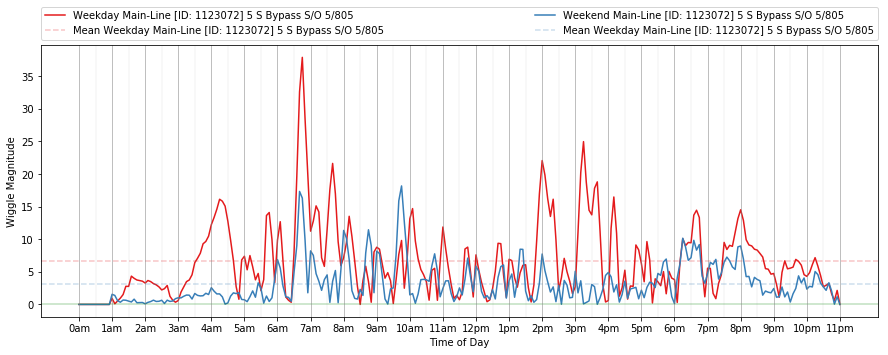

OFF-Ramp [41.385] 1100396 - ENCINITAS BLVD https://www.google.com/maps/place/33.048438,-117.287351


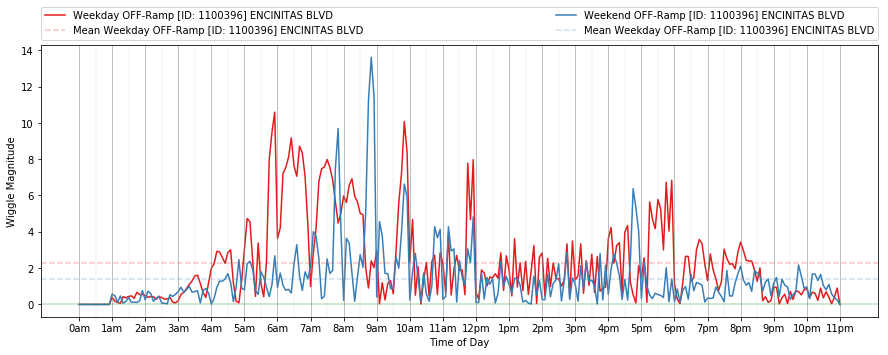

Main-Line [8.489] 1118442 - 5 SB @ E St https://www.google.com/maps/place/32.639695,-117.100165


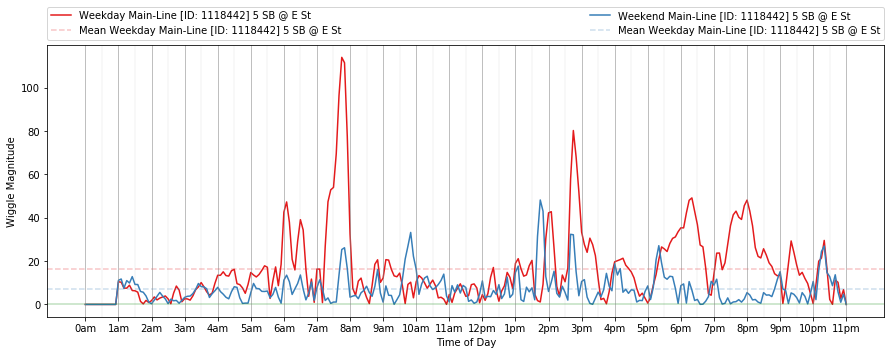

ON-Ramp [23.466] 1119308 - SB5 @BALBOA AVE https://www.google.com/maps/place/32.807702,-117.216754


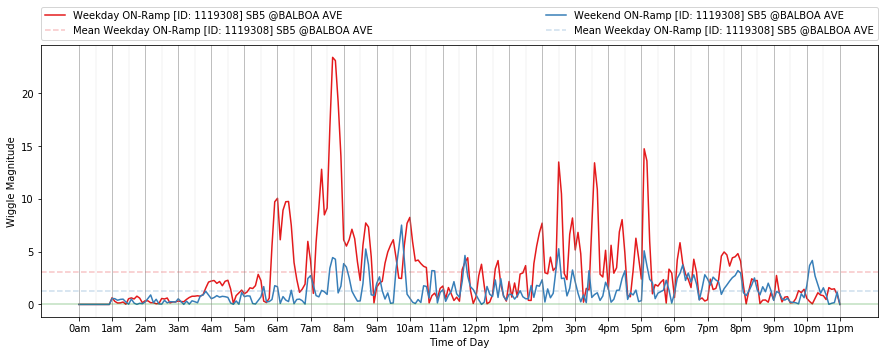

Main-Line [36.135] 1108468 - WB VIA DE LA VALLE https://www.google.com/maps/place/32.979922,-117.253241


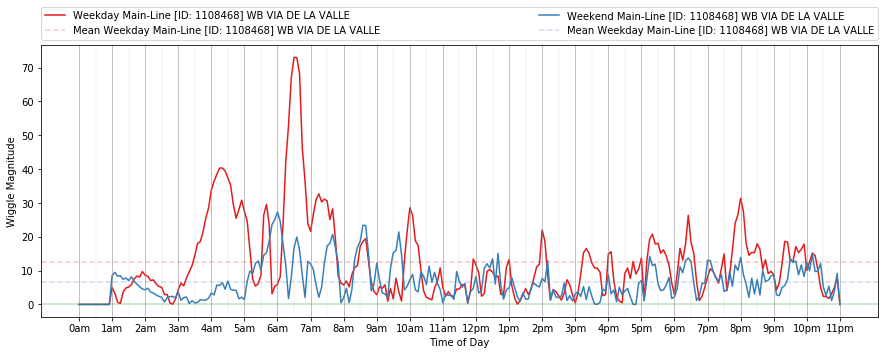

ON-Ramp [26.621] 1108670 - GILMAN DR to 5SB https://www.google.com/maps/place/32.848532,-117.235725


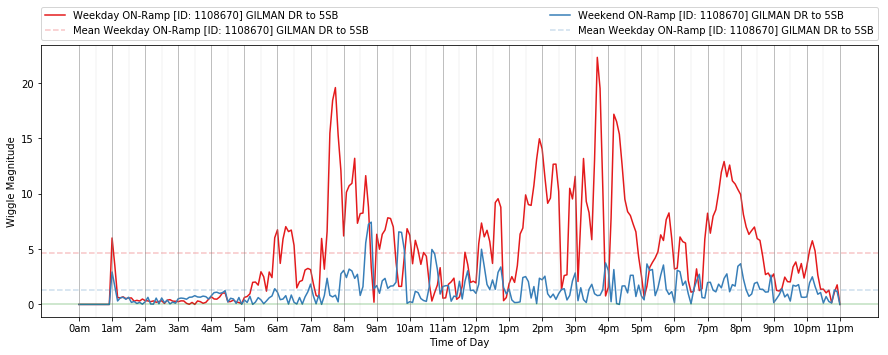

Main-Line [72.008] 1121740 - 5 SB Cristianitos Rd https://www.google.com/maps/place/33.394031,-117.592254


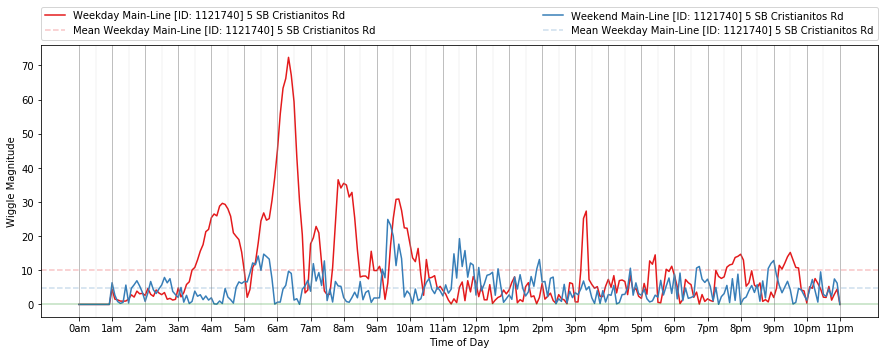

ON-Ramp [46.727] 1108684 - EB PALOMAR AIRPORT https://www.google.com/maps/place/33.120034,-117.320913


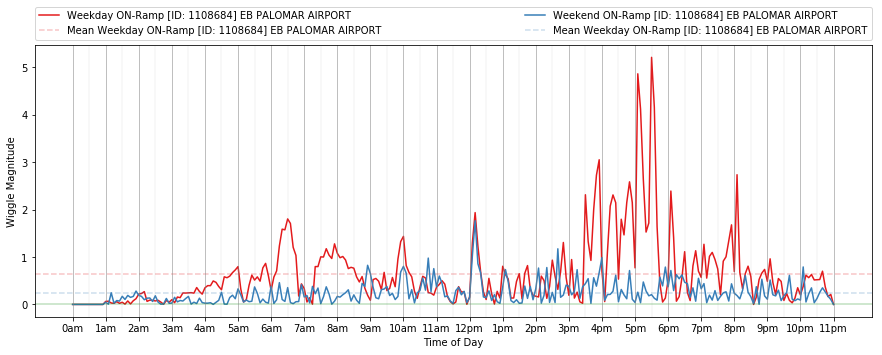

Main-Line [31.773] 1122560 - 5 SB N/O Carmel Mt https://www.google.com/maps/place/32.918796,-117.235719


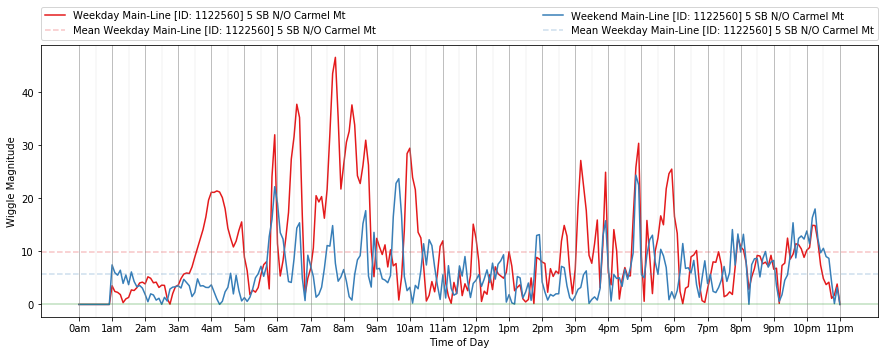

ON-Ramp [39.685] 1108476 - BIRMINGHAM DR https://www.google.com/maps/place/33.02625,-117.274915


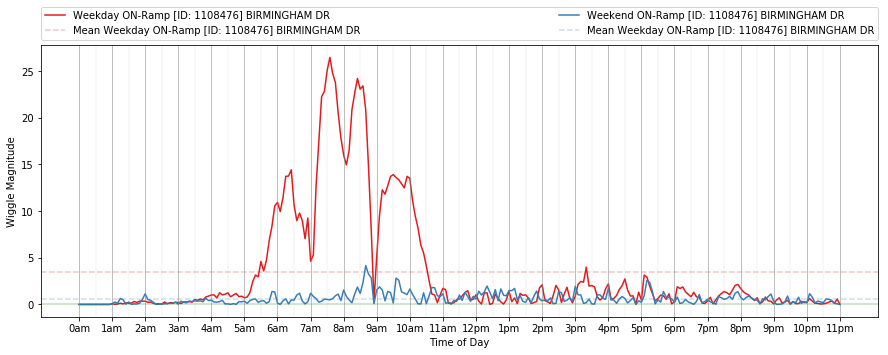

Main-Line [33.539] 1119834 - SB 5 S/O DEL MAR https://www.google.com/maps/place/32.943442,-117.242594


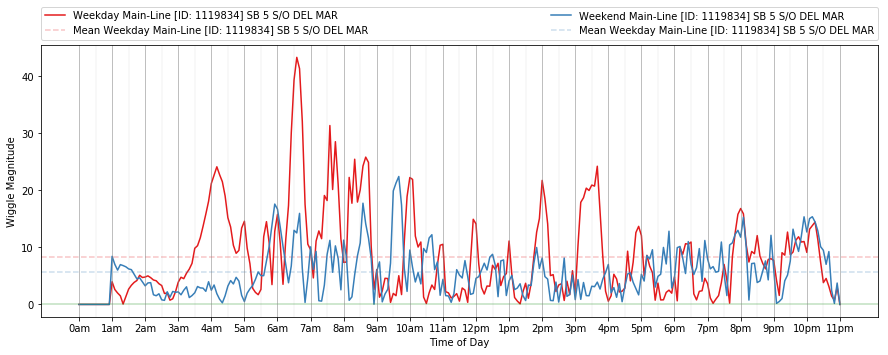

Main-Line [11.848] 1114254 -  N/O DIVISION https://www.google.com/maps/place/32.686001,-117.113072


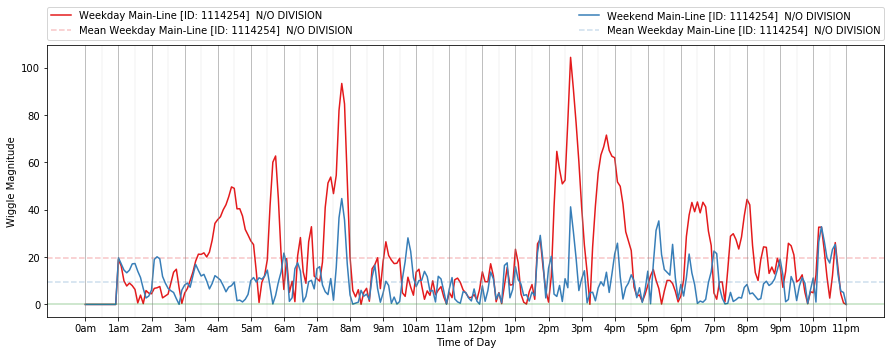

Main-Line [49.108] 1108560 - TAMARACK AVE https://www.google.com/maps/place/33.151704,-117.336331


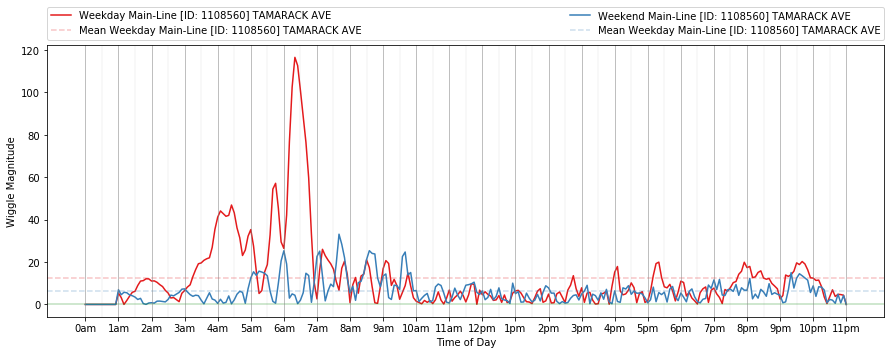

ON-Ramp [22.212] 1108713 - WB CLAIREMONT DR https://www.google.com/maps/place/32.791448,-117.207392


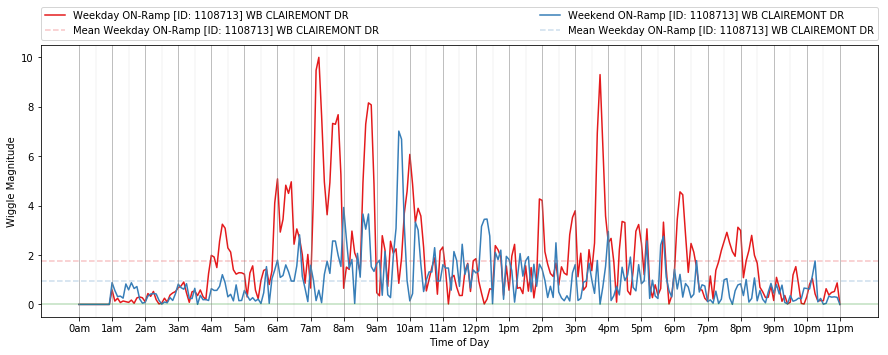

Main-Line [53.158] 1108672 - WB RTE 76/MISSION https://www.google.com/maps/place/33.200618,-117.373434


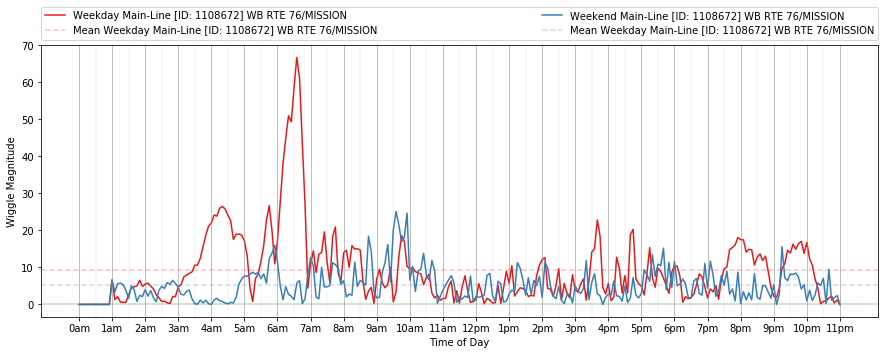

In [66]:
for station in weekday_df.station.unique().tolist():
    if station in [1100390, 1122252]: # these stations have no data
        continue
    plot_ramp_wiggles( station, links=True, figsize=(15,5), magnitude=True, meanline=True )